In [1]:
import pandas as pd
from math import ceil
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import parallel_coordinates
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D
from abnormals import abnormal_samples_set

Number of abnormal samples of each round, each cultivar
Riesling: round 2: 27, round 3: 24, round 4: 27, round 5: 22, round 6: 16
Cabernet Franc: round 2: 20, round 3: 12, round 4: 21, round 5: 27, round 6: 10
Concord: round 2: 15, round 3: 22, round 4: 29, round 5: 8, round 6: 18
Pinot Noir: round 2: 14, round 3: 27, round 4: 26, round 5: 13, round 6: 11


In [9]:
orginal_csv_files = [
    '../roi_data_cf_2.csv',
    '../roi_data_cf_3.csv',
    '../roi_data_cf_4.csv',
    '../roi_data_cf_5.csv',
    '../roi_data_cf_6.csv',
    '../roi_data_con_2.csv',
    '../roi_data_con_3.csv',
    '../roi_data_con_4.csv',
    '../roi_data_con_5.csv',
    '../roi_data_con_6.csv',
    '../roi_data_pn_2.csv',
    '../roi_data_pn_3.csv',
    '../roi_data_pn_4.csv',
    '../roi_data_pn_5.csv',
    '../roi_data_pn_6.csv',
    '../roi_data_ries_2.csv',
    '../roi_data_ries_3.csv',
    '../roi_data_ries_4.csv',
    '../roi_data_ries_5.csv',
    '../roi_data_ries_6.csv',
]

In [10]:
def generate_stat_csv_files(orginal_csv_files: list[str]):
    # generate a new csv file for all original csv files
    df_all = pd.DataFrame()

    for orginal_csv_file in orginal_csv_files:
        df = pd.read_csv(orginal_csv_file)
        round_number = int(orginal_csv_file.split('_')[-1].split('.')[0])
        
        # for each 'filename' col, parse the cane number & segment number, store them in new columns
        # filename example: 'CF_2.0_B01_N07.npy'
        # cane number is after the first letters 'B',
        df['cane'] = df['filename'].apply(lambda x: int(x.split('B')[1][0:2]))
        # segment number is after the first letters 'N0', it has range 1-9, and segment is the node number / 3
        df['segment'] = df['filename'].apply(lambda x: ceil(int(x.split('.npy')[0][-2:]) / 3))

        # for each 'Label' col, store the label in a new column
        df['mortality'] = df['Label']

        # for each 'Breed' col, store the breed in a new column
        df['cultivar'] = df['Breed'].apply(
            lambda x: 
                'CF' if 'CF' in x or 'Cf' in x or 'cf' in x
                else 'CON' if 'CON' in x or 'Con' in x or 'con' in x
                else 'PN' if 'PN' in x or 'Pn' in x or 'pn' in x
                else 'RIES' if 'RIES' in x or 'Ries' in x or 'ries' in x
                else 'OTHER')

        # for each 'Frozen', 'Frozen_1_week' cols, store the frozen status in a new column
        # treatment 1: frozen = False, frozen_1_week = False
        # treatment 2: frozen = True, frozen_1_week = False, round_number = 2 or 3 or 4
        # treatment 3: frozen = True, frozen_1_week = False, round_number = 5
        # treatment 4: frozen = True, frozen_1_week = True, round_number = 6,
        # treatment 5: frozen = True, frozen_1_week = False, round_number = 6,
        # treatment 6: elsecases, should not happen
        df['treatment'] = df.apply(
            lambda x: 
                1 if x['Frozen'] == False and x['Frozen_1_week'] == False 
                else 2 if x['Frozen'] == True and x['Frozen_1_week'] == False and round_number in [2, 3, 4] 
                else 3 if x['Frozen'] == True and x['Frozen_1_week'] == False and round_number == 5 
                else 4 if x['Frozen'] == True and x['Frozen_1_week'] == True and round_number == 6 
                else 5 if x['Frozen'] == True and x['Frozen_1_week'] == False and round_number == 6
                else 6, axis=1)
        rows_falling_into_else = df[df['treatment'] == 6]
        print('rows_falling_into_else:', rows_falling_into_else)
        
        # for each 'dev_stage' col, store the round number in a new column
        df['dev_stage'] = round_number

        # remove all the original columns
        df = df.drop(columns=['Label', 'Breed', 'Frozen', 'Frozen_1_week'])

        # append the new df to df_all
        df_all = df_all.append(df, ignore_index=True)
        print('finished processing', orginal_csv_file)

    # save the df_all to a new csv file
    df_all.to_csv('./csv/stat_all_data.csv', index=False)


In [11]:
generate_stat_csv_files(orginal_csv_files)

rows_falling_into_else: Empty DataFrame
Columns: [filename, Label, Breed, Frozen, Frozen_1_week, x_coordinate, y_coordinate, cane, segment, mortality, cultivar, treatment]
Index: []
finished processing ../roi_data_cf_2.csv
rows_falling_into_else: Empty DataFrame
Columns: [filename, Label, Frozen, Breed, Frozen_1_week, x_coordinate, y_coordinate, cane, segment, mortality, cultivar, treatment]
Index: []
finished processing ../roi_data_cf_3.csv
rows_falling_into_else: Empty DataFrame
Columns: [filename, Label, Breed, Frozen, Frozen_1_week, x_coordinate, y_coordinate, cane, segment, mortality, cultivar, treatment]
Index: []
finished processing ../roi_data_cf_4.csv
rows_falling_into_else: Empty DataFrame
Columns: [filename, Label, Breed, Frozen, Frozen_1_week, x_coordinate, y_coordinate, cane, segment, mortality, cultivar, treatment]
Index: []
finished processing ../roi_data_cf_5.csv
rows_falling_into_else: Empty DataFrame
Columns: [filename, Label, Breed, Frozen, Frozen_1_week, x_coordinat

/var/folders/xg/96_j_3ms72n4410x6g1yggfh0000gn/T/ipykernel_52028/366429099.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all = df_all.append(df, ignore_index=True)
/var/folders/xg/96_j_3ms72n4410x6g1yggfh0000gn/T/ipykernel_52028/366429099.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all = df_all.append(df, ignore_index=True)
/var/folders/xg/96_j_3ms72n4410x6g1yggfh0000gn/T/ipykernel_52028/366429099.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all = df_all.append(df, ignore_index=True)
/var/folders/xg/96_j_3ms72n4410x6g1yggfh0000gn/T/ipykernel_52028/366429099.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

In [2]:

# mean temperature before heating
def get_starting_temperature(curves: np.ndarray):
    return np.mean(curves[0:30]) if np.mean(curves[0:30]) > 1e-6 else 0

# peak temperature after heating
def get_peak_temperature(curves: np.ndarray):
    return np.max(curves[30:300])

# difference between peak temperature and starting temperature
def get_rising_waveform_feature(starting_temperature: float, peak_temperature: float):
    return (peak_temperature - starting_temperature) / (300 - 30)

# difference between peak temperature and end temperature
def get_falling_waveform_feature(curves: np.ndarray):
    return (np.max(curves[30:300]) - np.min(curves[300:600])) / (600 - 300)

def get_rising_waveform_std(curves: np.ndarray):
    return np.std(curves[30:300])

def get_falling_waveform_std(curves: np.ndarray):
    return np.std(curves[300:600])

def extract_frames(data: np.ndarray, y: int, x: int, radius: int) -> np.ndarray:
    extracted_frames = []
    for frame in data:
        # Extract a (raidus*2+1)^2 region around the center for each frame
        extracted_frame = frame[y-radius:y+radius+1, x-radius:x+radius+1]
        extracted_frames.append(extracted_frame)
    return np.array(extracted_frames)

# use the mean of the first 30 frames as the lowest standard
def normalize_curves_mean_method(curves: np.ndarray):
    mean = np.mean(curves[0:30])
    return curves - mean

# use the min of the first 30 frames as the lowest standard
def normalize_curves_min_method(curves: np.ndarray):
    min_value = np.min(curves[0:30])
    return curves - min_value

In [3]:
# curves: 600 image frames, 30fps
# heat at 2s, cool at 10s, end at 20s



df_new = pd.read_csv('./csv/stat_all_data_noabnormal.csv')

# traverse all rows, for each row, get the npy file, and calculate the features
for index, row in df_new.iterrows():
    filename = row['filename']
    round_number = row['dev_stage']
    x_pt = row['x_coordinate']
    y_pt = row['y_coordinate']

    roi_data = np.load(f'../roi_data/round_{round_number}/[ROI]{filename}')
    curves = normalize_curves_mean_method(np.mean(roi_data, axis=(1, 2)))

    print('processing', filename)
    print('round_number', round_number)
    print('shape of roi_data:', roi_data.shape)
    print('shape of roi_data_mean:', curves.shape)
    print('range of curves:', np.min(curves), np.max(curves))

    starting_temperature = get_starting_temperature(curves)
    peak_temperature = get_peak_temperature(curves)
    rising_waveform_feature = get_rising_waveform_feature(starting_temperature, peak_temperature)
    falling_waveform_feature = get_falling_waveform_feature(curves)
    rising_waveform_std = get_rising_waveform_std(curves)
    falling_waveform_std = get_falling_waveform_std(curves)

    print('starting_temperature:', starting_temperature)
    print('peak_temperature:', peak_temperature)
    print('rising_waveform_feature:', rising_waveform_feature)
    print('falling_waveform_feature:', falling_waveform_feature)
    print('rising_waveform_std:', rising_waveform_std)
    print('falling_waveform_std:', falling_waveform_std)

    df_new.at[index, 'starting_temperature'] = starting_temperature
    df_new.at[index, 'peak_temperature'] = peak_temperature
    df_new.at[index, 'rising_waveform_feature'] = rising_waveform_feature
    df_new.at[index, 'falling_waveform_feature'] = falling_waveform_feature
    df_new.at[index, 'rising_waveform_std'] = rising_waveform_std
    df_new.at[index, 'falling_waveform_std'] = falling_waveform_std

    # Store mean curve values across 600 frames as separate columns
    for frame in range(600):
        df_new.at[index, f'curve_frame_{frame}'] = curves[frame]

    print('-------------------------------------------------')

df_new.to_csv('./csv/stat_all_data_noabnormal_extend_mean_normalization.csv', index=False)


processing CF_2.0_B01_N01.npy
round_number 2
shape of roi_data: (600, 21, 21)
shape of roi_data_mean: (600,)
range of curves: -4.192139077853426 204.821466364323
starting_temperature: 0
peak_temperature: 204.821466364323
rising_waveform_feature: 0.7585980235715666
falling_waveform_feature: 0.5483824640967456
rising_waveform_std: 55.1441241786283
falling_waveform_std: 40.025381349755996
-------------------------------------------------
processing CF_2.0_B01_N02.npy
round_number 2
shape of roi_data: (600, 21, 21)
shape of roi_data_mean: (600,)
range of curves: -1.4160997732415126 255.87188208616863
starting_temperature: 0
peak_temperature: 255.87188208616863
rising_waveform_feature: 0.94767363735618
falling_waveform_feature: 0.7324565381708271
rising_waveform_std: 63.02138214570077
falling_waveform_std: 52.56330996873636
-------------------------------------------------
processing CF_2.0_B01_N03.npy
round_number 2
shape of roi_data: (600, 21, 21)
shape of roi_data_mean: (600,)
range of c

/var/folders/xg/96_j_3ms72n4410x6g1yggfh0000gn/T/ipykernel_74569/740239278.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_new.at[index, f'curve_frame_{frame}'] = curves[frame]
/var/folders/xg/96_j_3ms72n4410x6g1yggfh0000gn/T/ipykernel_74569/740239278.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_new.at[index, f'curve_frame_{frame}'] = curves[frame]
/var/folders/xg/96_j_3ms72n4410x6g1yggfh0000gn/T/ipykernel_74569/740239278.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of

processing CF_2.0_B04_N07.npy
round_number 2
shape of roi_data: (600, 21, 21)
shape of roi_data_mean: (600,)
range of curves: -2.7818594104301155 222.2453514739227
starting_temperature: 0
peak_temperature: 219.31111111111204
rising_waveform_feature: 0.8122633744856002
falling_waveform_feature: 0.40984882842026005
rising_waveform_std: 56.35362687218805
falling_waveform_std: 32.26333236092867
-------------------------------------------------
processing CF_2.0_B05_N01.npy
round_number 2
shape of roi_data: (600, 21, 21)
shape of roi_data_mean: (600,)
range of curves: -1.5820105820112076 250.83749055177577
starting_temperature: 0
peak_temperature: 249.30687830687748
rising_waveform_feature: 0.9233588085439907
falling_waveform_feature: 0.6724867724867727
rising_waveform_std: 61.28559185662207
falling_waveform_std: 49.27584431231213
-------------------------------------------------
processing CF_2.0_B05_N02.npy
round_number 2
shape of roi_data: (600, 21, 21)
shape of roi_data_mean: (600,)
ran

In [4]:
df_new_new = pd.read_csv('./csv/stat_all_data_noabnormal_extend_mean_normalization.csv')

all_curves = []
for index, row in df_new_new.iterrows():
    filename = row['filename']
    round_number = row['dev_stage']
    x_pt = row['x_coordinate']
    y_pt = row['y_coordinate']

    roi_data = np.load(f'../roi_data/round_{round_number}/[ROI]{filename}')
    curves = normalize_curves_mean_method(np.mean(roi_data, axis=(1, 2)))
    all_curves.append(curves)
    print('prcessed:', filename)

all_curves = np.array(all_curves)
print('all_curves.shape:', all_curves.shape)

# Apply PCA to reduce dimensionality
pca = PCA()
pca_result = pca.fit_transform(all_curves)
cum_var = np.cumsum(pca.explained_variance_ratio_)
num_components = np.min(np.where(cum_var >= 0.99)[0]) + 1
pca_final = PCA(n_components=num_components)
pca_result_final = pca_final.fit_transform(all_curves)
print('pca_result_final.shape:', pca_result_final.shape)

# save the pca_result to a new csv file
for i in range(pca_result_final.shape[1]):
    df_new_new[f'pca_{i}'] = pca_result_final[:, i]
df_new_new.to_csv('./csv/stat_all_data_noabnormal_extend_mean_normalization_pca.csv', index=False)



prcessed: CF_2.0_B01_N01.npy
prcessed: CF_2.0_B01_N02.npy
prcessed: CF_2.0_B01_N03.npy
prcessed: CF_2.0_B01_N04.npy
prcessed: CF_2.0_B01_N05.npy
prcessed: CF_2.0_B01_N06.npy
prcessed: CF_2.0_B01_N07.npy
prcessed: CF_2.0_B01_N08.npy
prcessed: CF_2.0_B02_N01.npy
prcessed: CF_2.0_B02_N02.npy
prcessed: CF_2.0_B02_N03.npy
prcessed: CF_2.0_B02_N04.npy
prcessed: CF_2.0_B02_N05.npy
prcessed: CF_2.0_B02_N06.npy
prcessed: CF_2.0_B02_N08.npy
prcessed: CF_2.0_B02_N09.npy
prcessed: CF_2.0_B03_N02.npy
prcessed: CF_2.0_B03_N03.npy
prcessed: CF_2.0_B03_N05.npy
prcessed: CF_2.0_B03_N06.npy
prcessed: CF_2.0_B03_N07.npy
prcessed: CF_2.0_B03_N08.npy
prcessed: CF_2.0_B03_N09.npy
prcessed: CF_2.0_B04_N01.npy
prcessed: CF_2.0_B04_N02.npy
prcessed: CF_2.0_B04_N03.npy
prcessed: CF_2.0_B04_N04.npy
prcessed: CF_2.0_B04_N05.npy
prcessed: CF_2.0_B04_N06.npy
prcessed: CF_2.0_B04_N07.npy
prcessed: CF_2.0_B05_N01.npy
prcessed: CF_2.0_B05_N02.npy
prcessed: CF_2.0_B05_N03.npy
prcessed: CF_2.0_B05_N04.npy
prcessed: CF_2

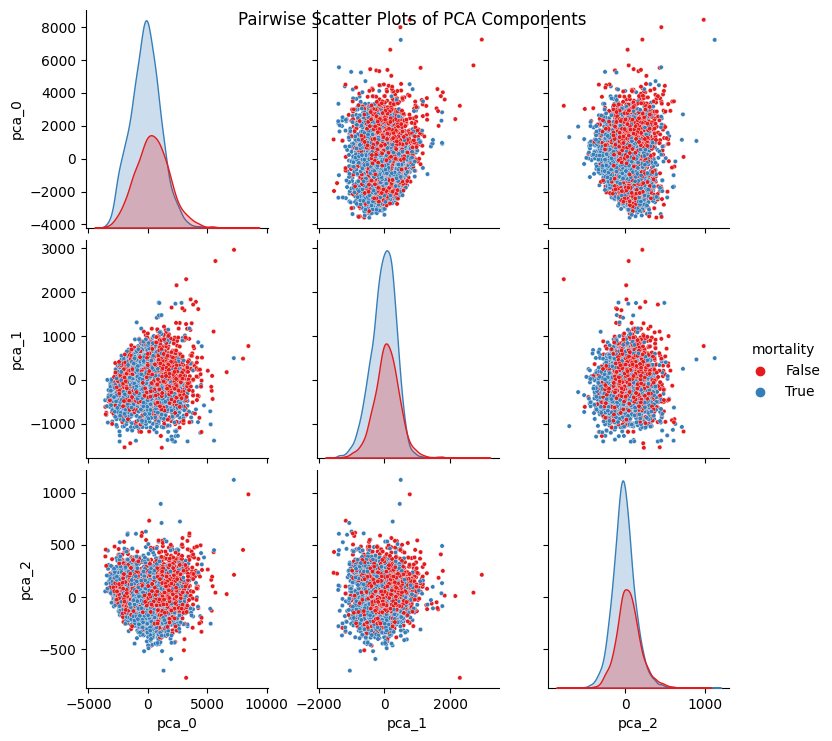

In [5]:
df_pca = pd.read_csv('./csv/stat_all_data_noabnormal_extend_mean_normalization_pca.csv')
pca_columns = ['pca_0', 'pca_1', 'pca_2', 'pca_3', 'pca_4', 'pca_5']
pca_data = df_pca[pca_columns]

# # Pairwise Scatter Plots (Pairplot)
sns.pairplot(
    df_pca[['pca_0', 'pca_1', 'pca_2', 'mortality']], 
    hue='mortality', 
    palette='Set1',
    plot_kws={'s': 10}
    )
plt.suptitle("Pairwise Scatter Plots of PCA Components")
plt.show()

pca = PCA()
components = pca.fit_transform(df_pca[pca_columns])

# Create labels for the axes with variance explained
explained_variance_ratio = pca.explained_variance_ratio_ * 100
labels_dict = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(explained_variance_ratio[:6])  # Use the first 6 PCs
}

# Create the scatter matrix plot using Plotly
fig = px.scatter_3d(
    x=components[:, 0],  # PC0
    y=components[:, 1],  # PC1
    z=components[:, 2],  # PC2
    color=df_pca['mortality'],
    labels={
        'x': f"PC0 ({explained_variance_ratio[0]:.1f}%)",
        'y': f"PC1 ({explained_variance_ratio[1]:.1f}%)",
        'z': f"PC2 ({explained_variance_ratio[2]:.1f}%)"
    },
    title="3D Scatter Plot of PCA Components",
    
    width=600,
    height=600
)
fig.update_traces(marker=dict(size=2))

# Show the plot
fig.show()

In [6]:
df_new_new = pd.read_csv('./csv/stat_all_data_noabnormal_extend_mean_normalization.csv')

# Dictionary to store all curves grouped by round_number
all_curves_by_round = {}

for index, row in df_new_new.iterrows():
    filename = row['filename']
    round_number = row['dev_stage']
    x_pt = row['x_coordinate']
    y_pt = row['y_coordinate']

    # Load ROI data based on the filename and round number
    roi_data = np.load(f'../roi_data/round_{round_number}/[ROI]{filename}')
    curves = normalize_curves_mean_method(np.mean(roi_data, axis=(1, 2)))

    # Append the curves to the respective round group
    if round_number not in all_curves_by_round:
        all_curves_by_round[round_number] = []
    all_curves_by_round[round_number].append(curves)

# Apply PCA for each round and save results separately
for round_number, curves_list in all_curves_by_round.items():
    all_curves = np.array(curves_list)
    print(f'Processing round {round_number}: all_curves.shape = {all_curves.shape}')

    # Apply PCA to reduce dimensionality
    pca = PCA()
    pca_result = pca.fit_transform(all_curves)
    cum_var = np.cumsum(pca.explained_variance_ratio_)
    num_components = np.min(np.where(cum_var >= 0.99)[0]) + 1
    pca_final = PCA(n_components=num_components)
    pca_result_final = pca_final.fit_transform(all_curves)
    print(f'Round {round_number}: pca_result_final.shape = {pca_result_final.shape}')

    # Prepare a DataFrame to store the PCA results for this round
    round_df = df_new_new[df_new_new['dev_stage'] == round_number].copy()
    for i in range(pca_result_final.shape[1]):
        round_df[f'pca_{i}'] = pca_result_final[:, i]

    # Save the DataFrame to a new CSV file for each round
    round_df.to_csv(f'./csv/stat_all_data_noabnormal_extend_mean_normalization_pca_round_{round_number}.csv', index=False)
    print(f'Saved PCA results for round {round_number} to CSV')


Processing round 2: all_curves.shape = (1226, 600)
Round 2: pca_result_final.shape = (1226, 11)
Saved PCA results for round 2 to CSV
Processing round 3: all_curves.shape = (1301, 600)
Round 3: pca_result_final.shape = (1301, 5)
Saved PCA results for round 3 to CSV
Processing round 4: all_curves.shape = (1284, 600)
Round 4: pca_result_final.shape = (1284, 9)
Saved PCA results for round 4 to CSV
Processing round 5: all_curves.shape = (1405, 600)
Round 5: pca_result_final.shape = (1405, 9)
Saved PCA results for round 5 to CSV
Processing round 6: all_curves.shape = (1517, 600)
Round 6: pca_result_final.shape = (1517, 8)
Saved PCA results for round 6 to CSV


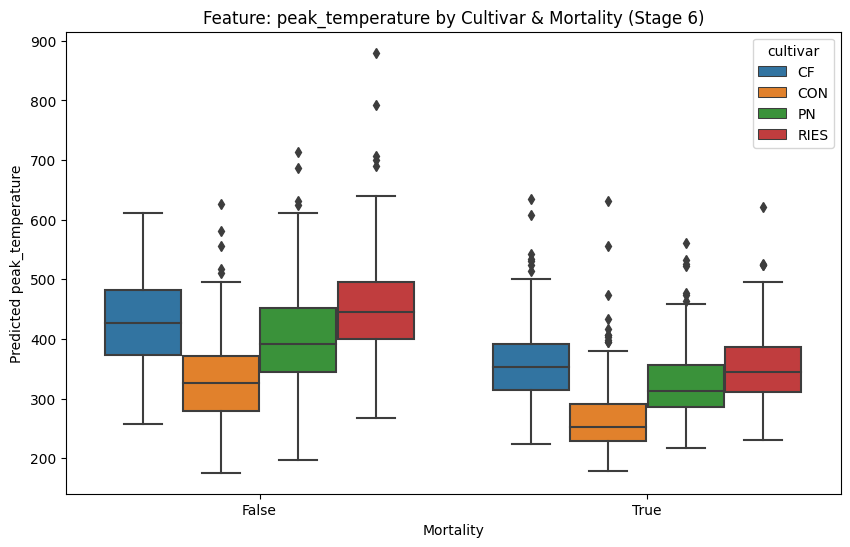

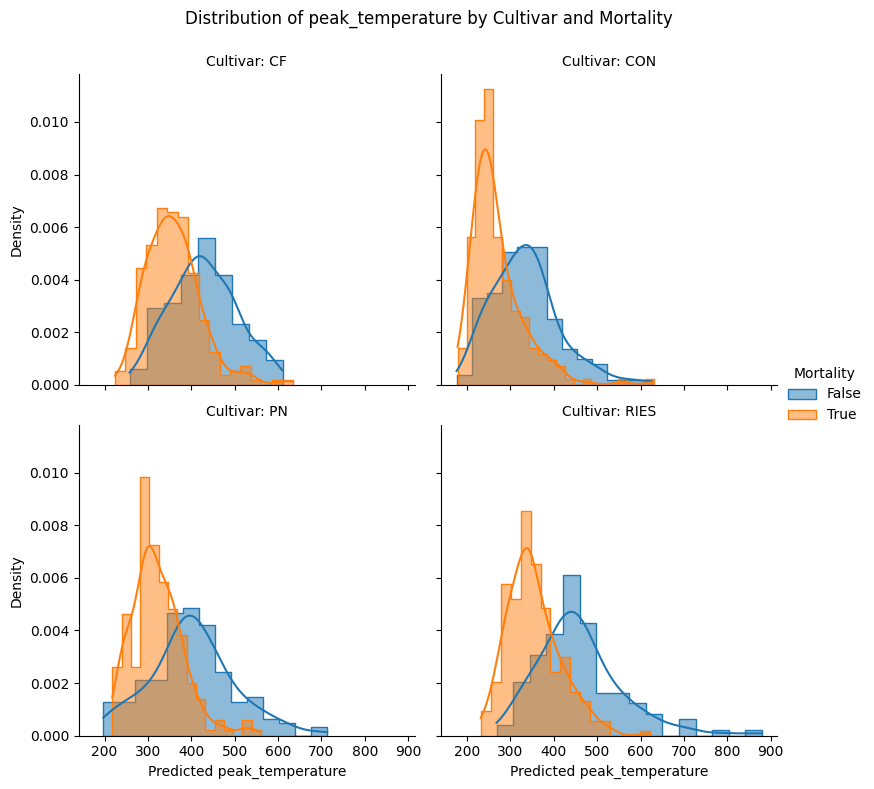

In [7]:
df = pd.read_csv(f'./csv/stat_all_data_noabnormal_extend_mean_normalization_pca_round_6.csv')


plt.figure(figsize=(10, 6))
sns.boxplot(x='mortality', y='peak_temperature', hue='cultivar', data=df)  # Replace 'pca_0' with the column name you want to plot
plt.title('Feature: peak_temperature by Cultivar & Mortality (Stage 6)')
plt.xlabel('Mortality')
plt.ylabel('Predicted peak_temperature')
plt.legend(title='cultivar')
plt.show()


# Create a FacetGrid with one plot per cultivar
g = sns.FacetGrid(df, col="cultivar", hue="mortality", col_wrap=2, height=4, sharex=True, sharey=True)

# Map the histogram plot onto the grid
g.map(sns.histplot, "peak_temperature", kde=True, stat="density", common_norm=False, element="step")

# Add a legend for the mortality variable
g.add_legend(title="Mortality")

# Set titles and labels
g.set_axis_labels("Predicted peak_temperature", "Density")
g.set_titles("Cultivar: {col_name}")
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Distribution of peak_temperature by Cultivar and Mortality')

plt.show()

Processing PCA columns: ['pca_0', 'pca_1', 'pca_2', 'pca_3', 'pca_4', 'pca_5', 'pca_6', 'pca_7', 'pca_8', 'pca_9', 'pca_10']
Pairplot for Cultivar: CF, Stage: 2


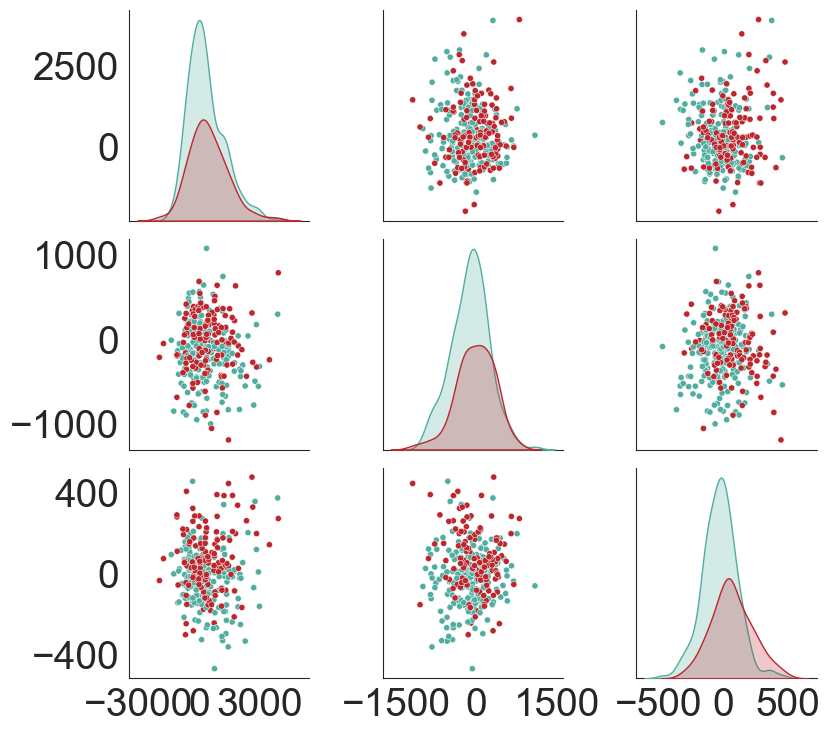

Pairplot for Cultivar: CON, Stage: 2


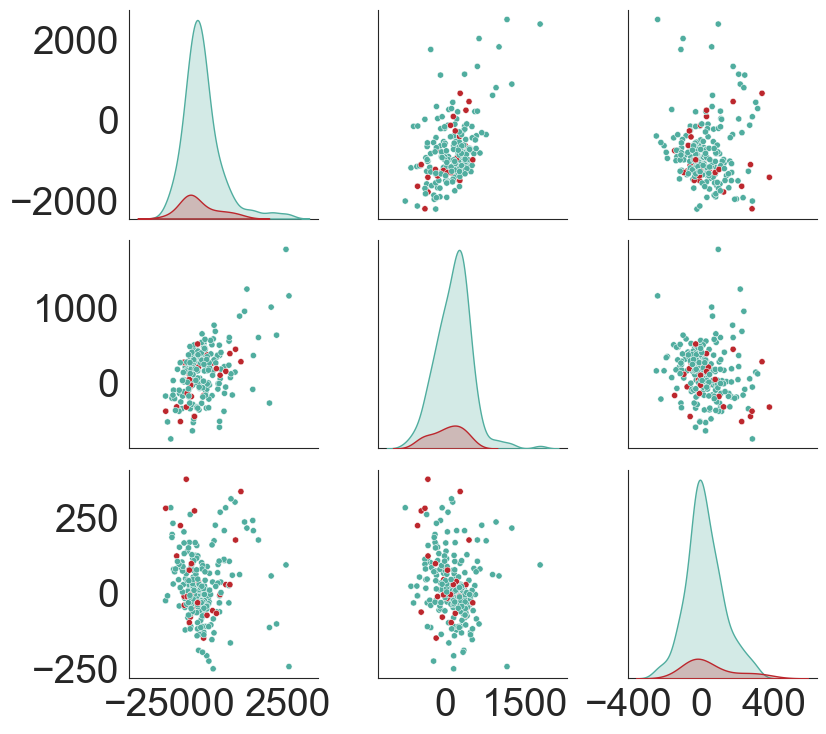

Pairplot for Cultivar: PN, Stage: 2


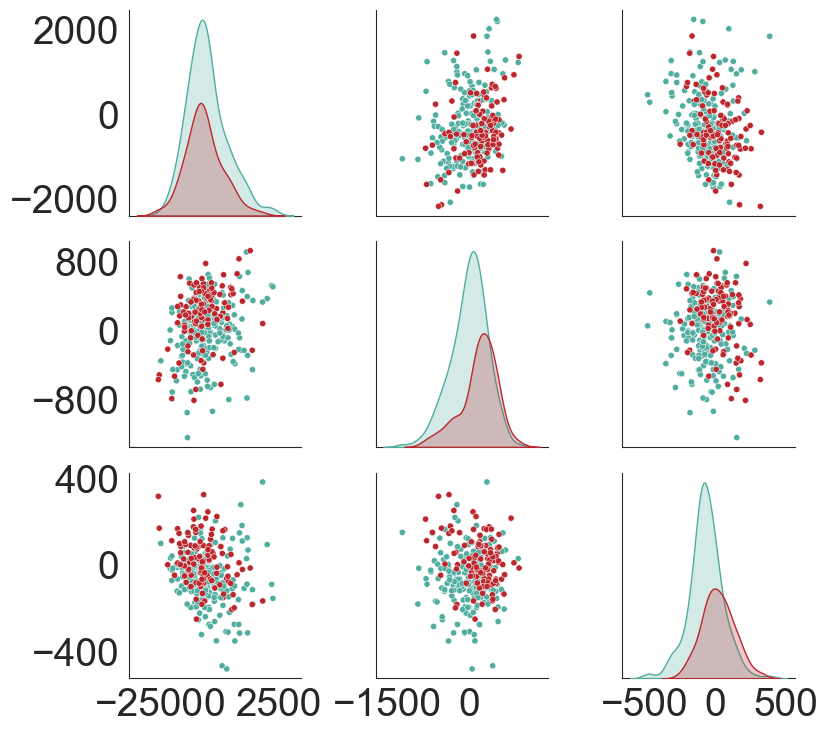

Pairplot for Cultivar: RIES, Stage: 2


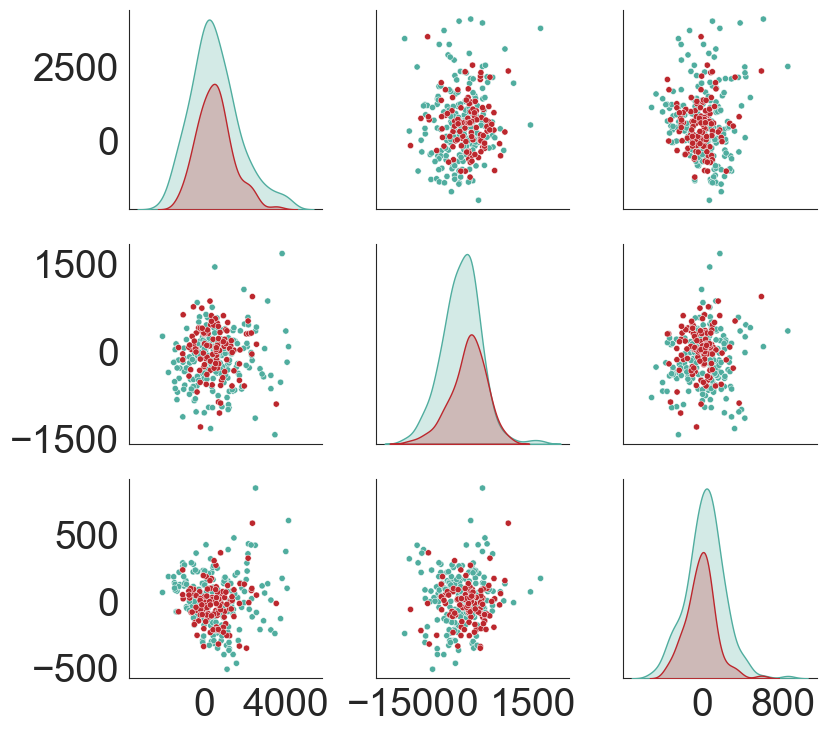

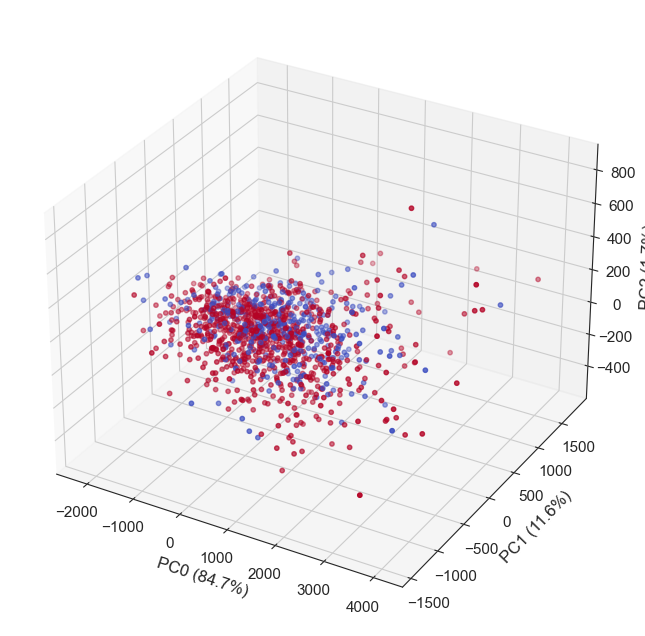

Processing PCA columns: ['pca_0', 'pca_1', 'pca_2', 'pca_3', 'pca_4']
Pairplot for Cultivar: CF, Stage: 3


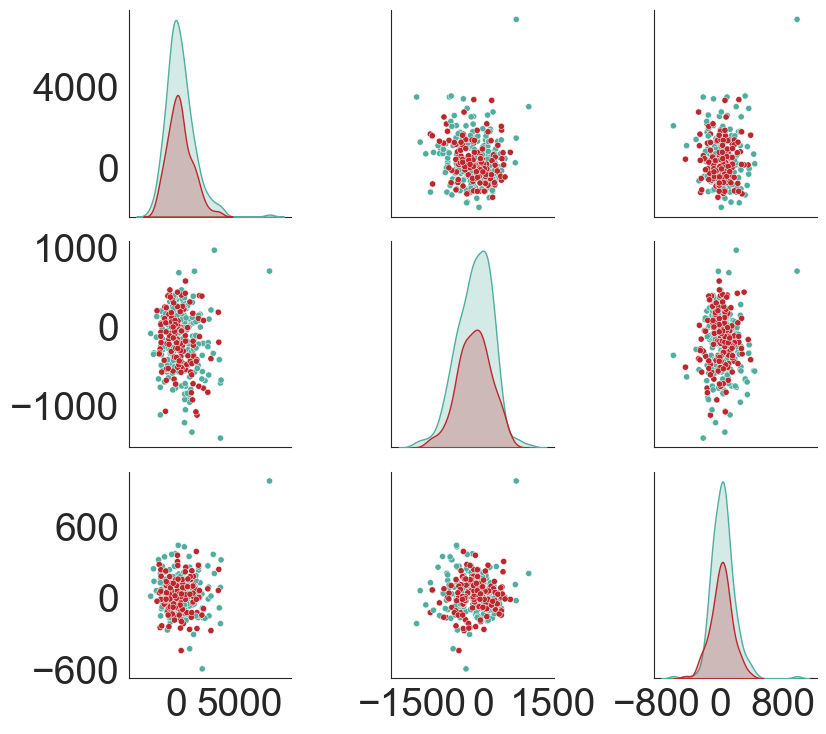

Pairplot for Cultivar: CON, Stage: 3


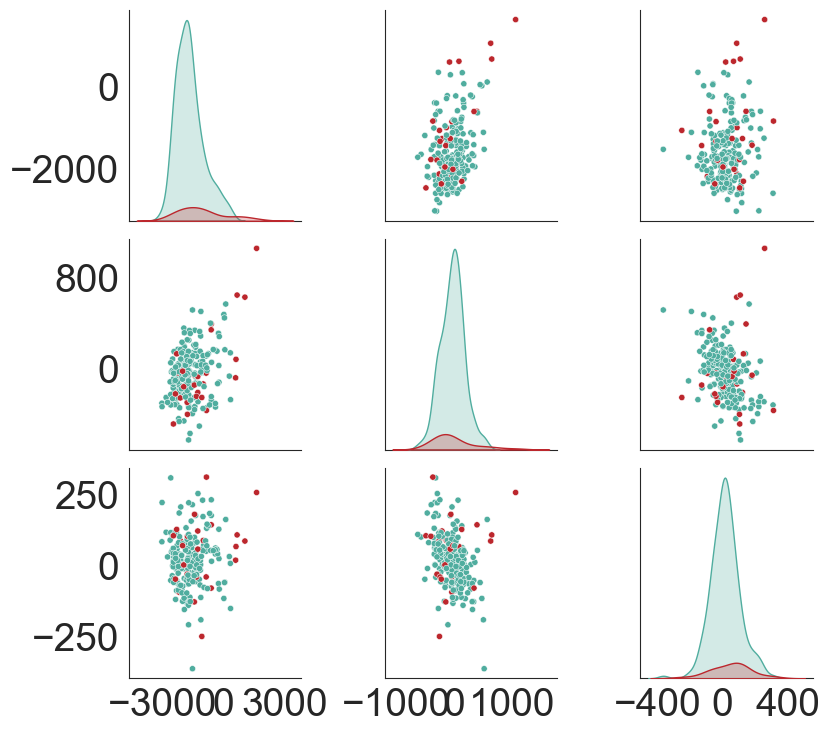

Pairplot for Cultivar: PN, Stage: 3


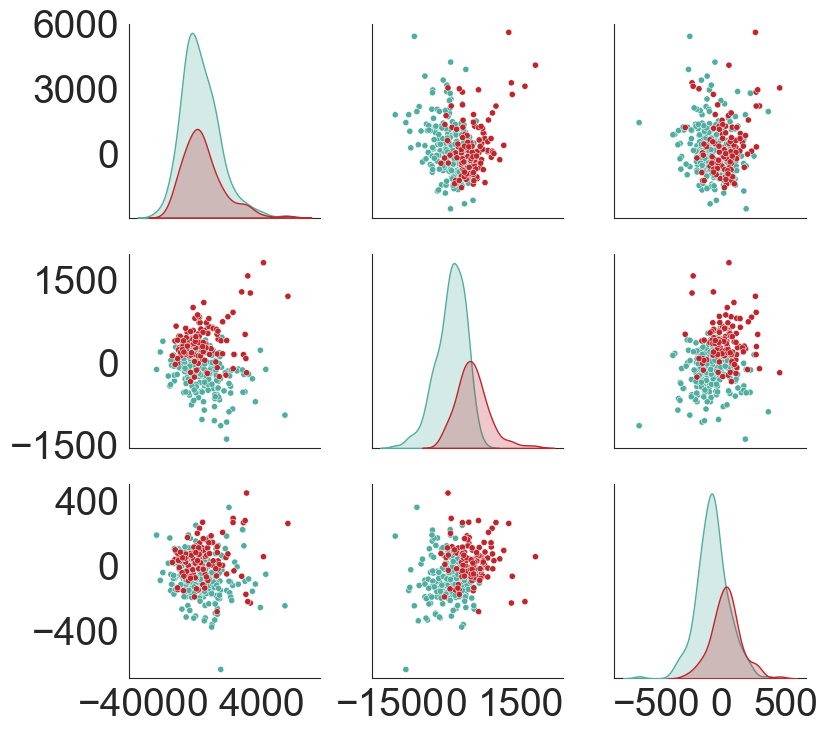

Pairplot for Cultivar: RIES, Stage: 3


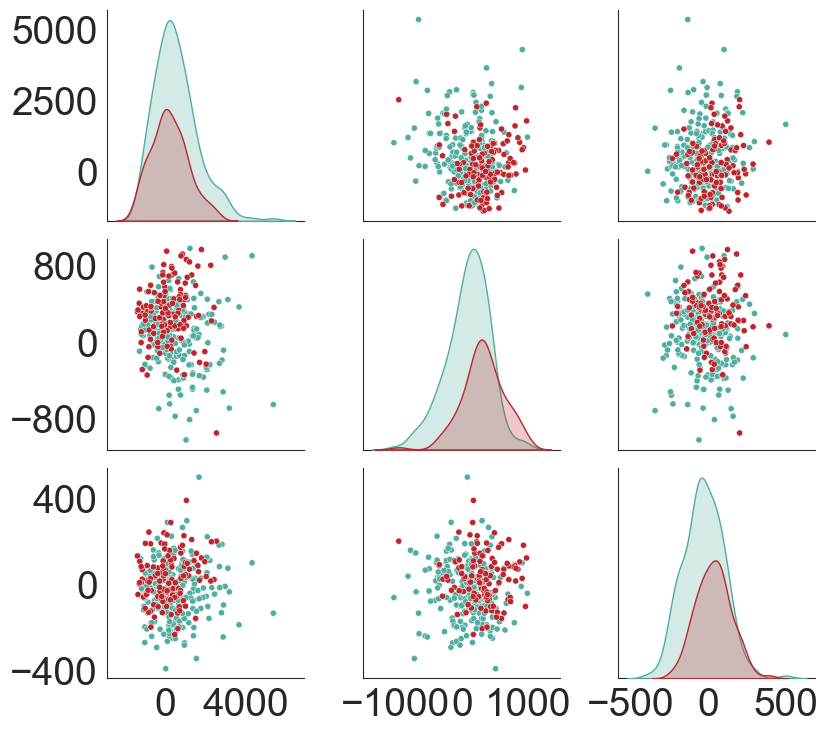

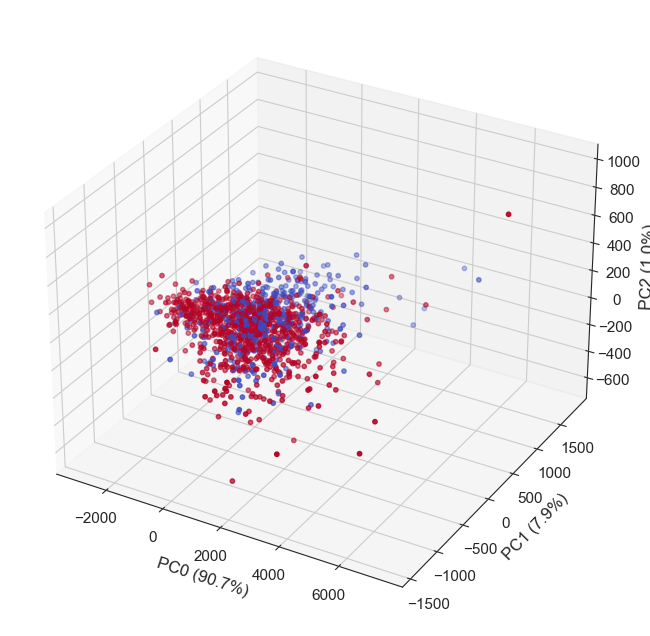

Processing PCA columns: ['pca_0', 'pca_1', 'pca_2', 'pca_3', 'pca_4', 'pca_5', 'pca_6', 'pca_7', 'pca_8']
Pairplot for Cultivar: CF, Stage: 4


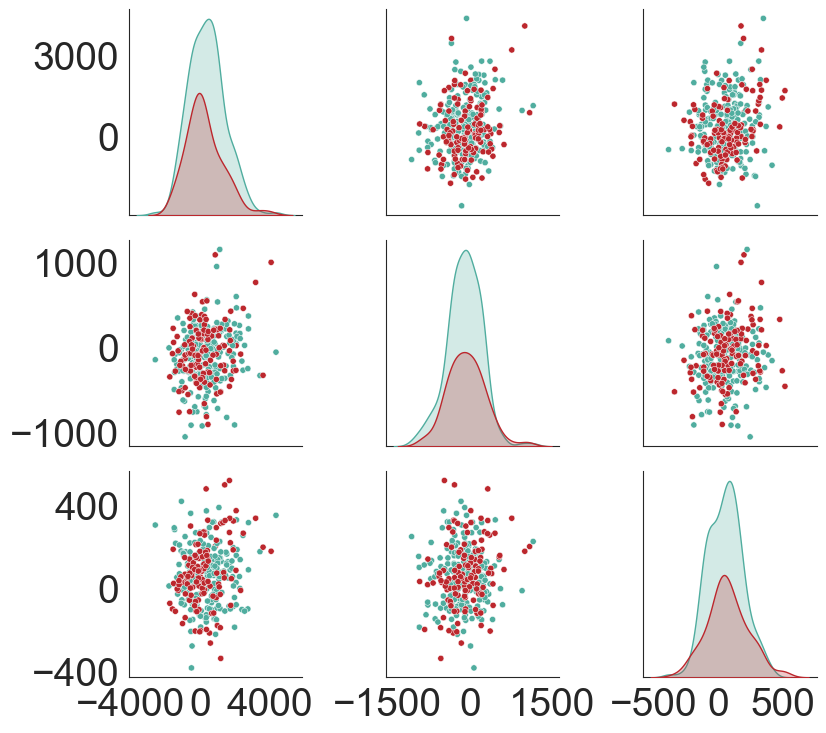

Pairplot for Cultivar: CON, Stage: 4


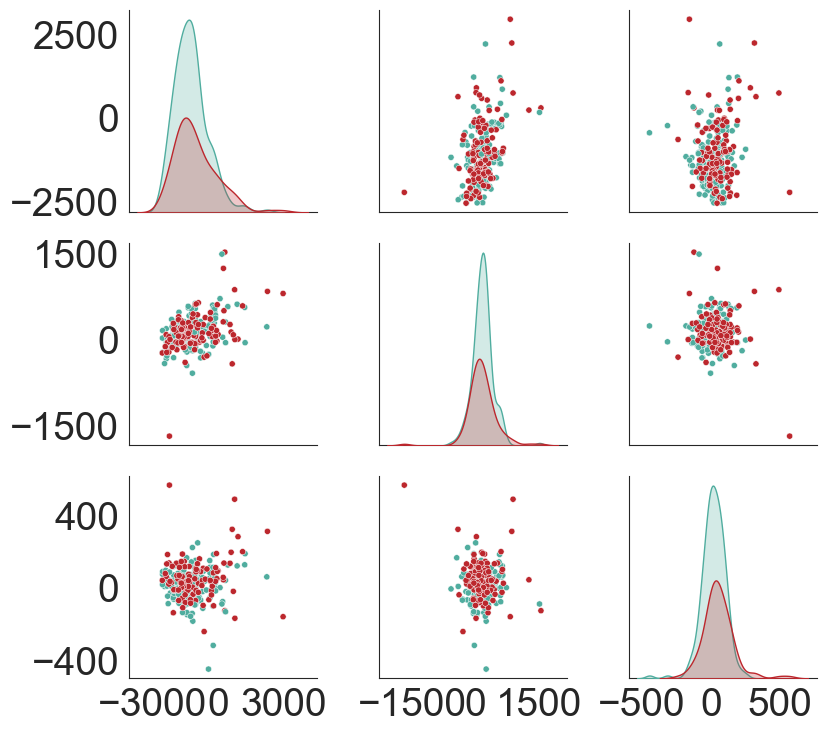

Pairplot for Cultivar: PN, Stage: 4


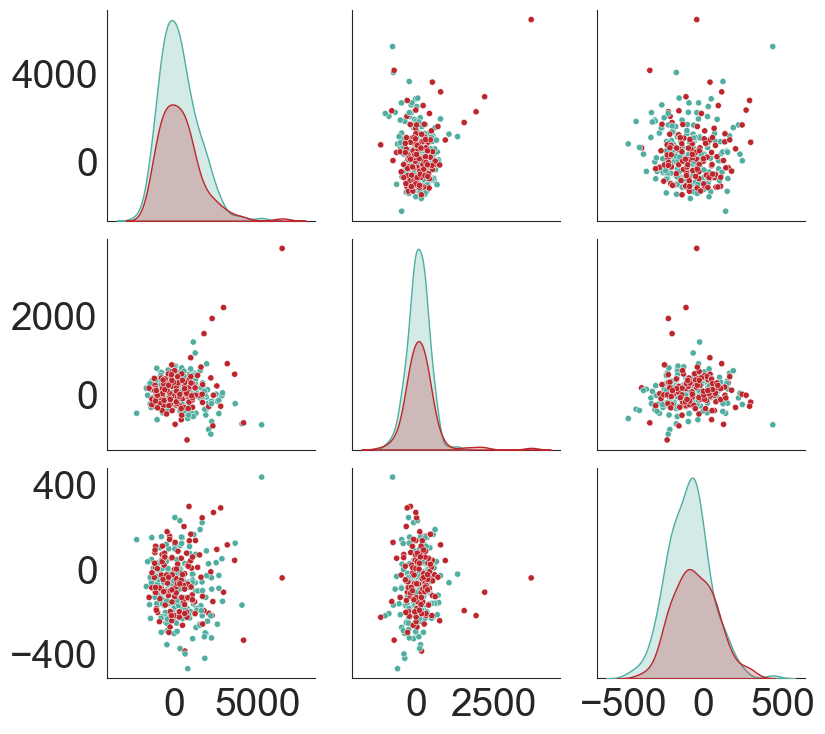

Pairplot for Cultivar: RIES, Stage: 4


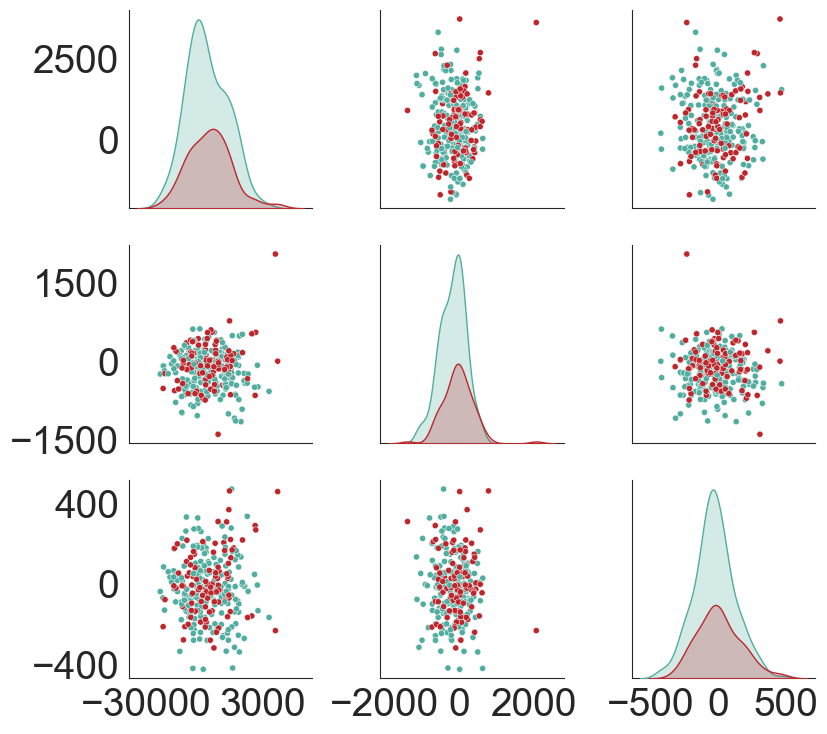

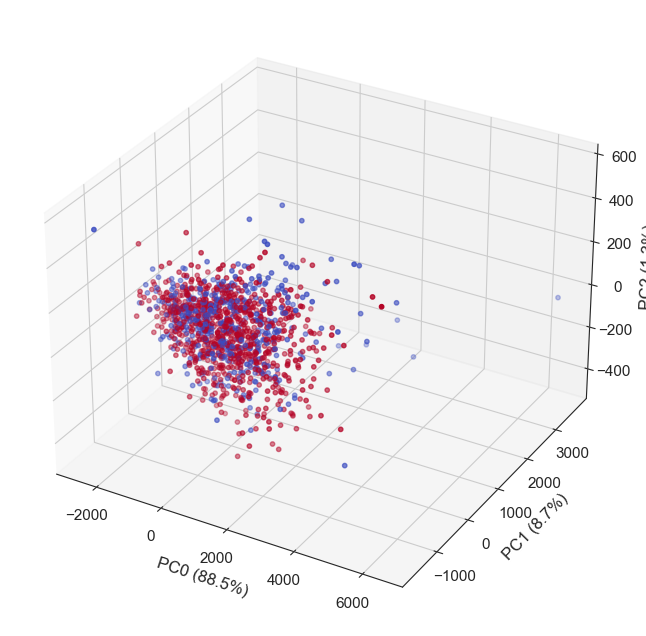

Processing PCA columns: ['pca_0', 'pca_1', 'pca_2', 'pca_3', 'pca_4', 'pca_5', 'pca_6', 'pca_7', 'pca_8']
Pairplot for Cultivar: CF, Stage: 5


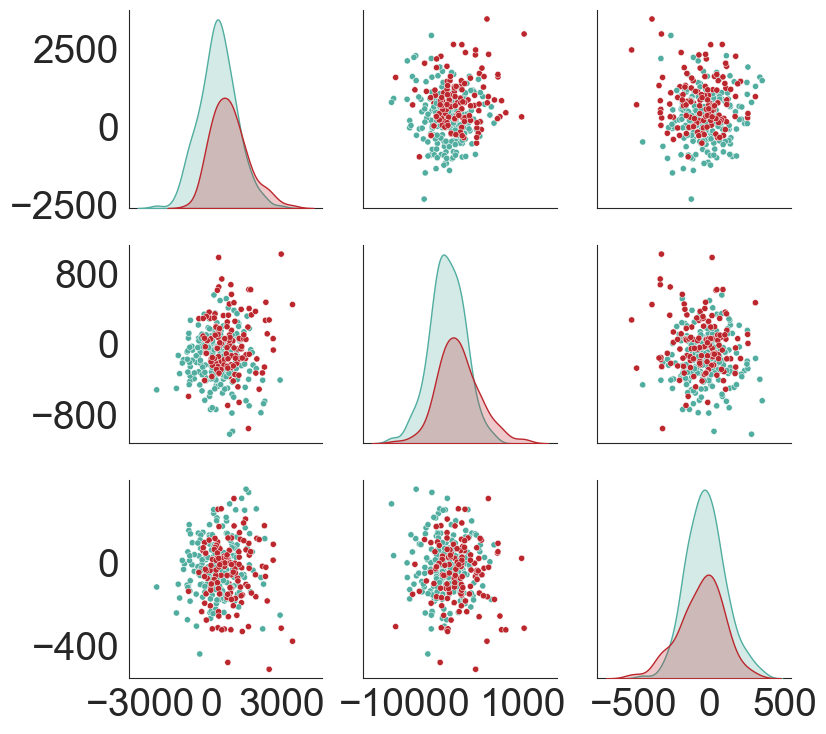

Pairplot for Cultivar: CON, Stage: 5


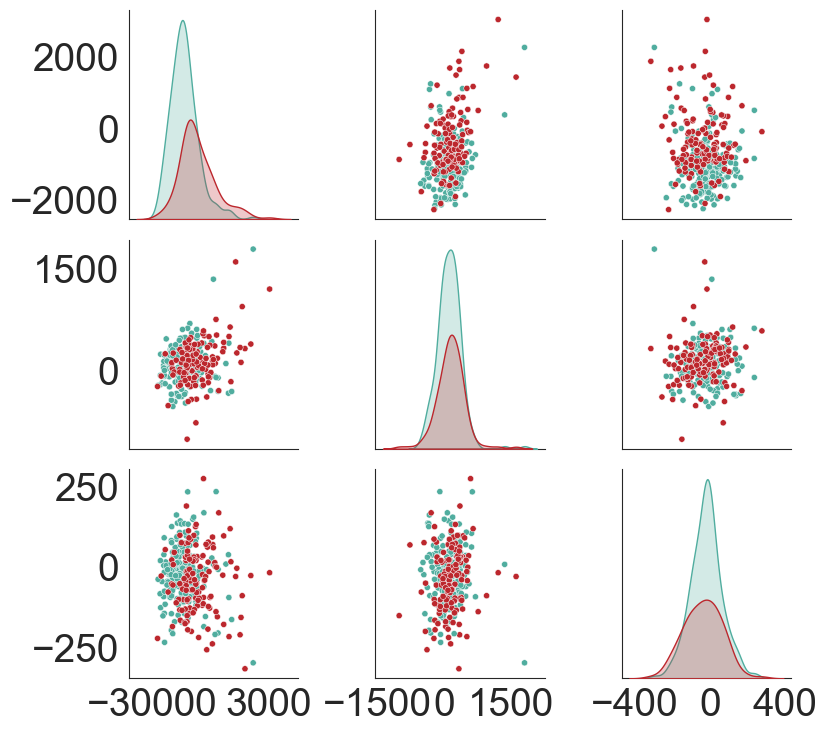

Pairplot for Cultivar: PN, Stage: 5


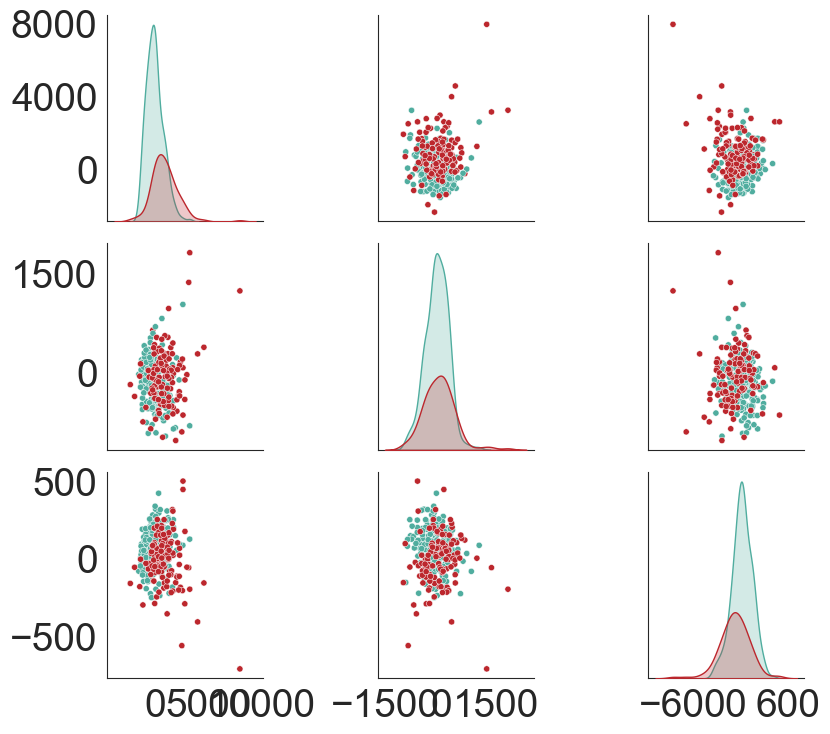

Pairplot for Cultivar: RIES, Stage: 5


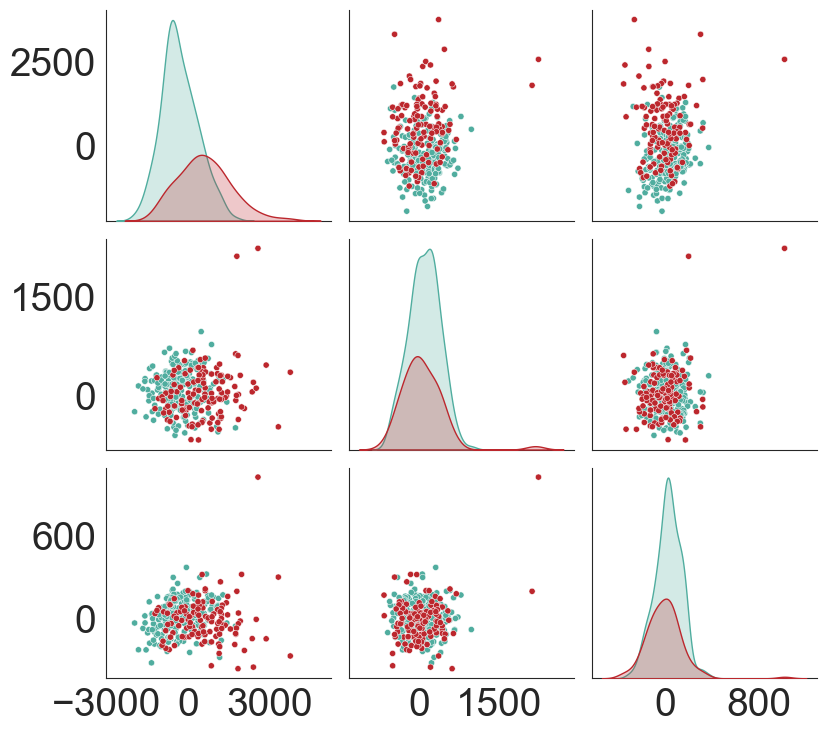

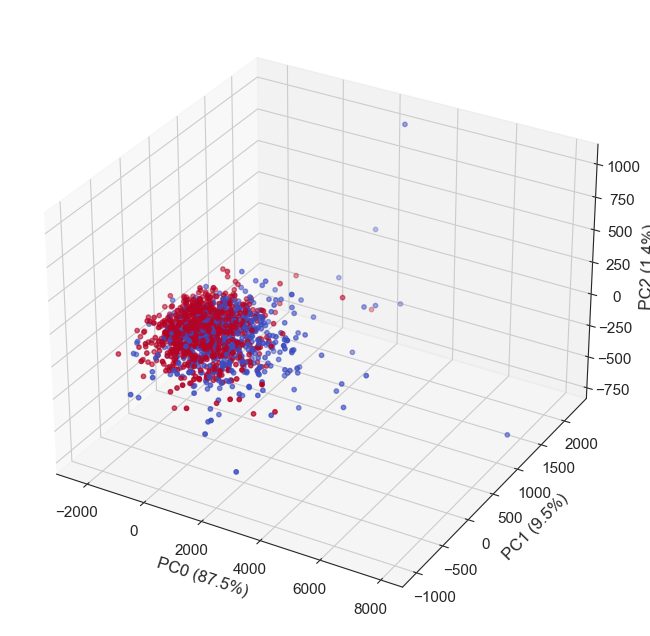

Processing PCA columns: ['pca_0', 'pca_1', 'pca_2', 'pca_3', 'pca_4', 'pca_5', 'pca_6', 'pca_7']
Pairplot for Cultivar: CF, Stage: 6


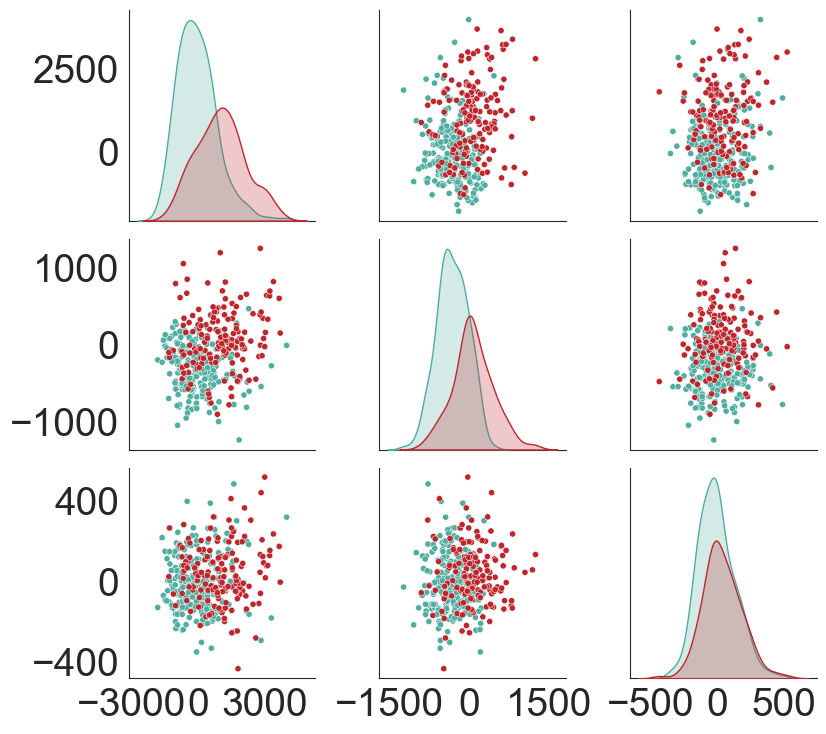

Pairplot for Cultivar: CON, Stage: 6


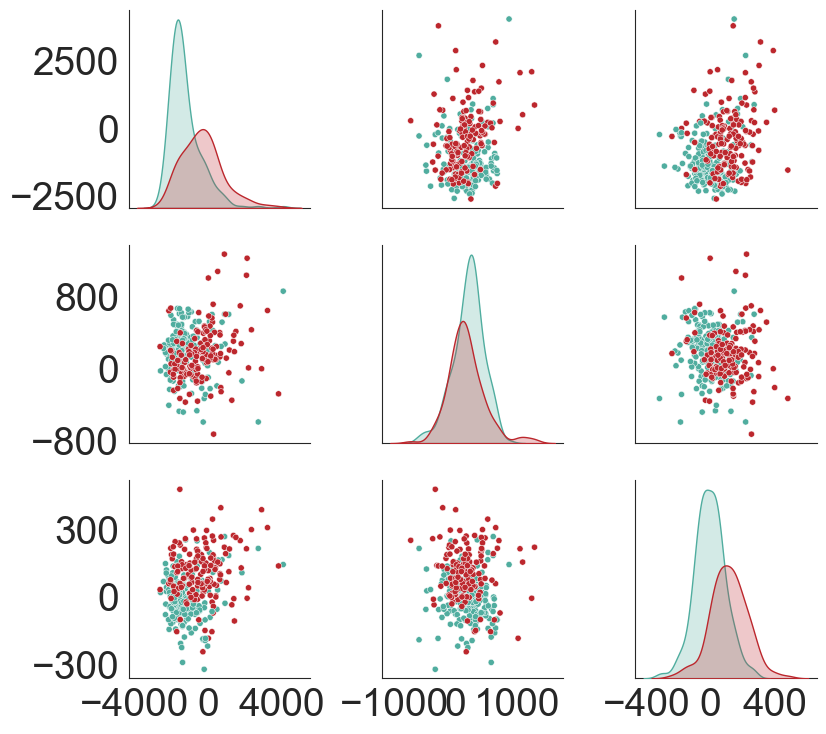

Pairplot for Cultivar: PN, Stage: 6


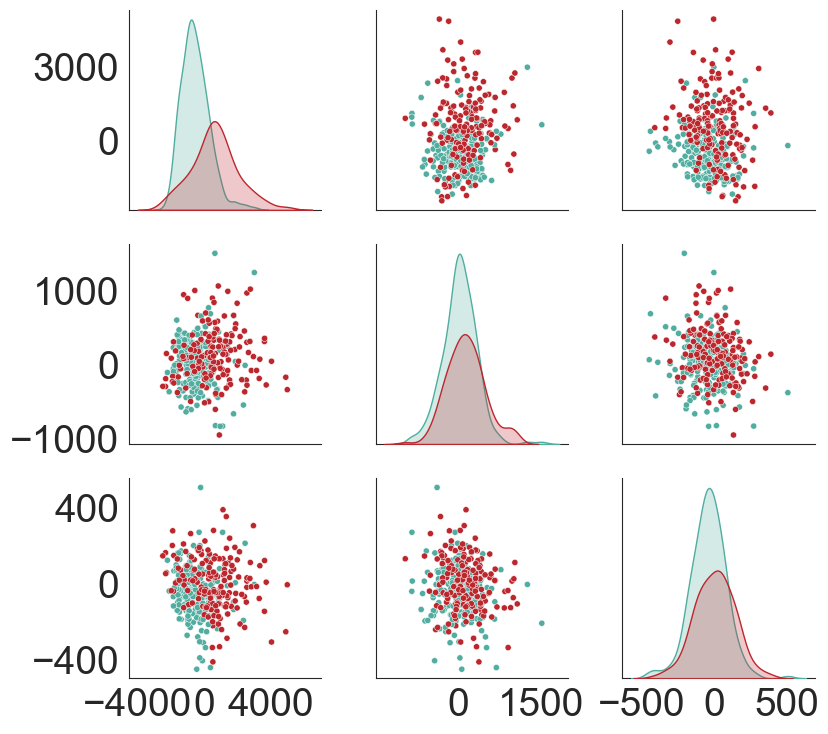

Pairplot for Cultivar: RIES, Stage: 6


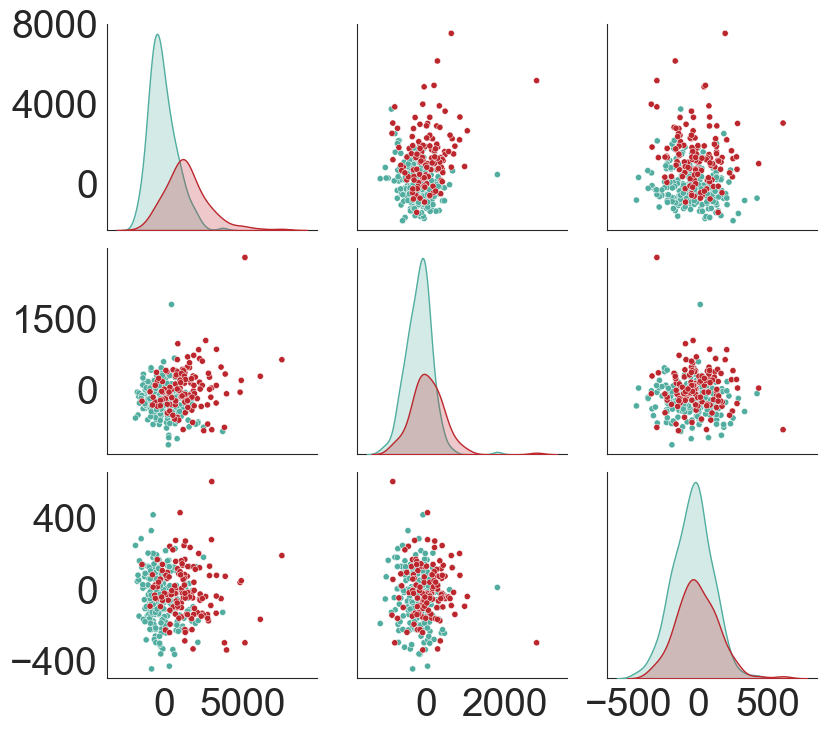

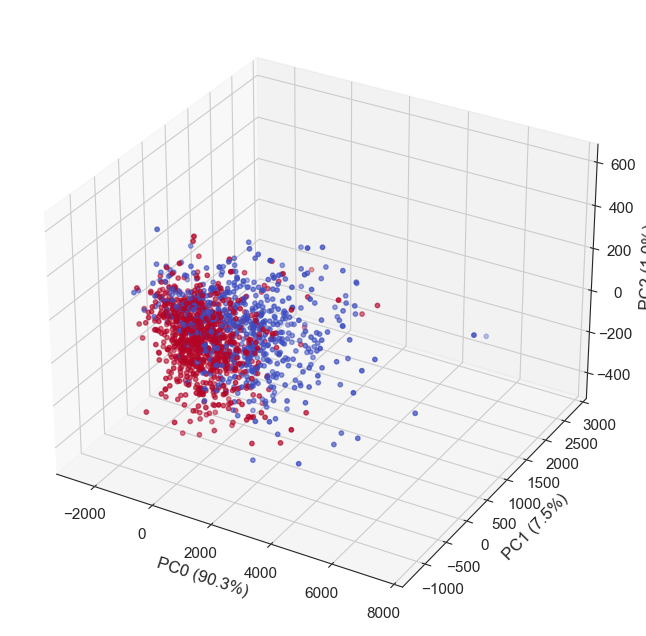

In [8]:
import itertools 

def process_pca_plot_by_round(round: int):
    # Load the PCA results for the selected round
    pc_number_map = {2: 11, 3: 5, 4: 9, 5: 9, 6: 8}
    df_pca = pd.read_csv(f'./csv/stat_all_data_noabnormal_extend_mean_normalization_pca_round_{round}.csv')

    # Select PCA columns based on the round number
    pca_columns = [f'pca_{i}' for i in range(pc_number_map[round])]
    print(f'Processing PCA columns: {pca_columns}')

    # Perform PCA on the selected components and keep only the first 3 PCs
    pca = PCA()
    components = pca.fit_transform(df_pca[pca_columns])
    explained_variance_ratio = pca.explained_variance_ratio_ * 100

    # # Add the first 3 PCs to the DataFrame
    # df_pca['PC1'] = components[:, 0]
    # df_pca['PC2'] = components[:, 1]
    # df_pca['PC3'] = components[:, 2]


    # 2D scatter plot for each cultivar
    sns.set_style("white")
    plt.rcParams.update({
        'font.size': 12,  # Set the minimum font size
        'axes.titlesize': 12,
        'axes.labelsize': 12,
        'xtick.labelsize': 11,
        'ytick.labelsize': 11,
        'legend.fontsize': 11,
        'figure.titlesize': 14
    })
    custom_palette = {0: '#bc272d', 1: '#50ad9f'}
    cultivars = df_pca['cultivar'].unique()
    for cultivar in cultivars:
        # Filter data for the specific cultivar
        df_subset = df_pca[df_pca['cultivar'] == cultivar]
        
        # Create the pairplot
        print(f'Pairplot for Cultivar: {cultivar}, Stage: {round}')
        g = sns.pairplot(df_subset[['pca_0', 'pca_1', 'pca_2', 'mortality']], 
                    hue='mortality', 
                    palette=custom_palette,
                    plot_kws={'s': 20})
        g._legend.remove()
        for ax in g.axes.flatten():
            if ax is not None:  # Safety check for empty axes
                ax.set_xlabel(None)
                ax.set_ylabel(None)
                ax.xaxis.set_major_locator(plt.MaxNLocator(3))
                ax.yaxis.set_major_locator(plt.MaxNLocator(3))
                ax.tick_params(axis='both', which='major', labelsize=28)

        plt.tight_layout()
        plt.savefig(f'./plots/pca_scatter/pca_scatter_{cultivar}_stage{round}.svg', bbox_inches='tight')
        plt.show()
                
    

    # 3d scatter plot for each cultivar
    # explained_variance_ratio = pca.explained_variance_ratio_ * 100
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot
    scatter = ax.scatter(
        df_pca['pca_0'], 
        df_pca['pca_1'], 
        df_pca['pca_2'], 
        c=df_pca['mortality'], 
        cmap='coolwarm',
        s=10
    )

    # Set axis labels
    ax.set_xlabel(f"PC0 ({explained_variance_ratio[0]:.1f}%)")
    ax.set_ylabel(f"PC1 ({explained_variance_ratio[1]:.1f}%)")
    ax.set_zlabel(f"PC2 ({explained_variance_ratio[2]:.1f}%)")

    # Save the figure as SVG
    # plt.tight_layout()
    # plt.savefig('./plots/3d_scatter_pca.svg', format='svg')
    plt.show()


    # df_long = df_pca.melt(id_vars=['cultivar', 'mortality'], value_vars=['pca_0', 'pca_1', 'pca_2'], 
    #                     var_name='Principal Component', value_name='Value')

    # # Plot each PC as a violin plot with mortality hue, separated by cultivar
    # g = sns.catplot(
    #     data=df_long, x='Principal Component', y='Value', hue='mortality',
    #     col='cultivar', kind='violin', split=True, palette='Set1', height=4, aspect=0.7
    # )
    # g.fig.suptitle(f"Distribution of PCs by Mortality within Each Cultivar stage {round}", y=1.05)
    # plt.show()


for round in range(2, 7):
    process_pca_plot_by_round(round)

Pairplot for Cultivar: CF, Stage: 2


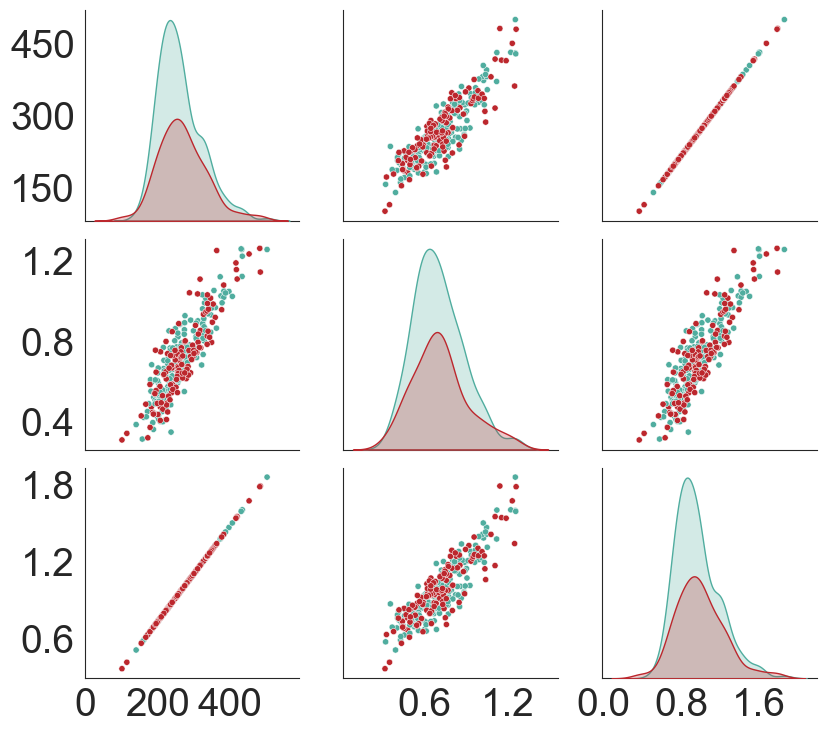

Pairplot for Cultivar: CON, Stage: 2


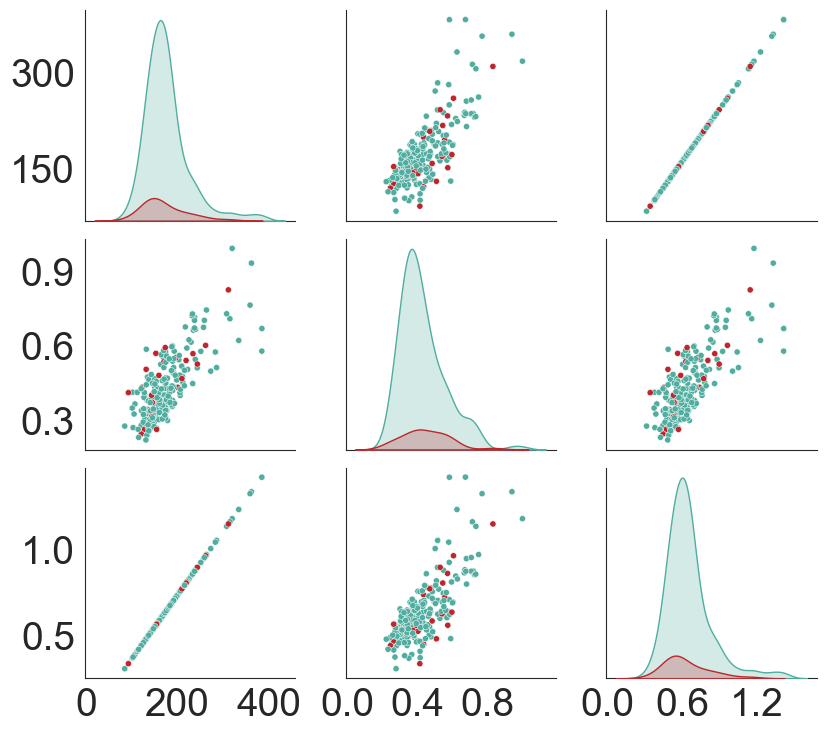

Pairplot for Cultivar: PN, Stage: 2


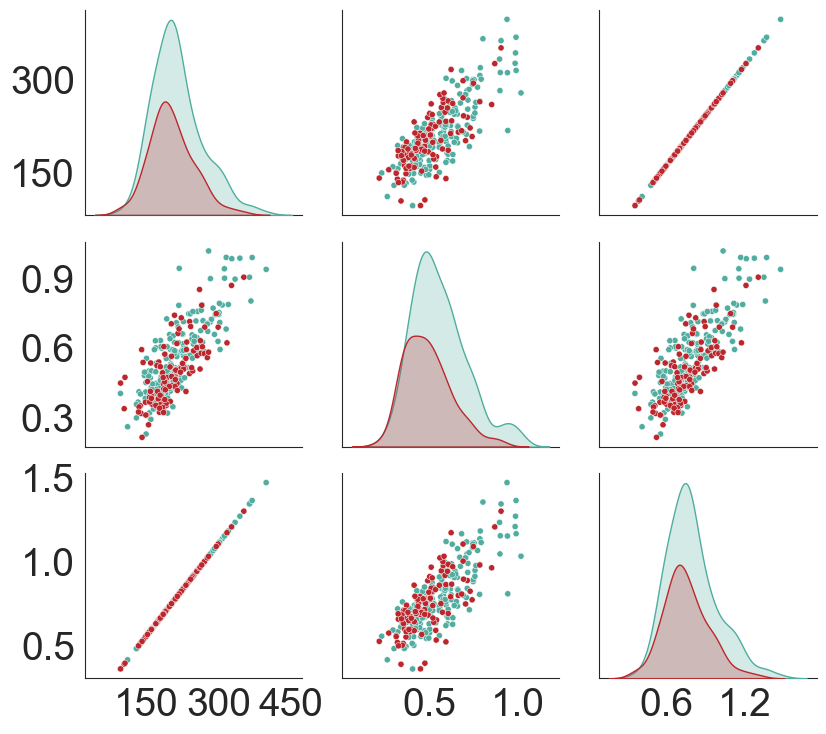

Pairplot for Cultivar: RIES, Stage: 2


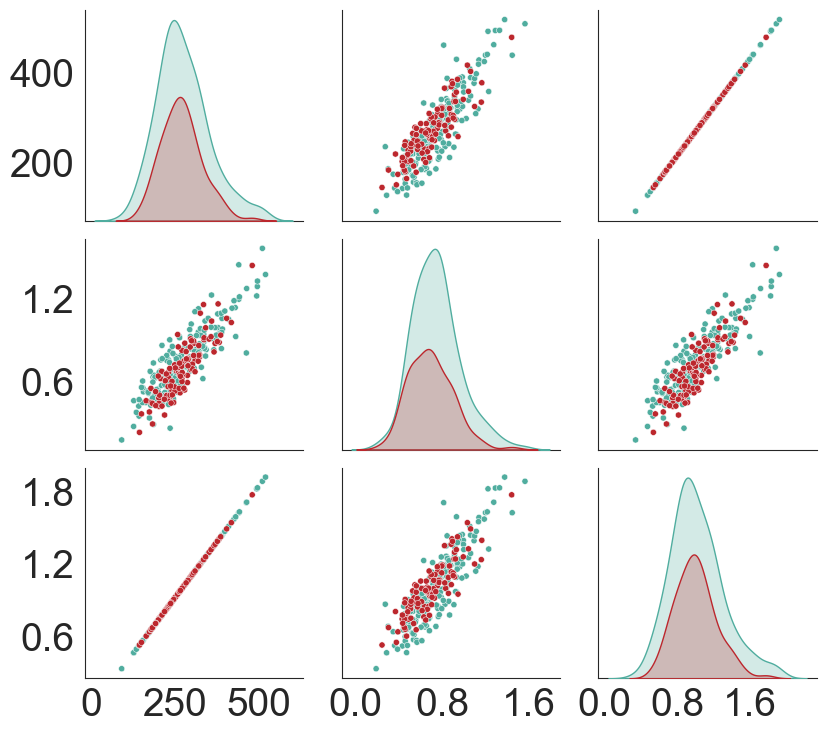

Pairplot for Cultivar: CF, Stage: 3


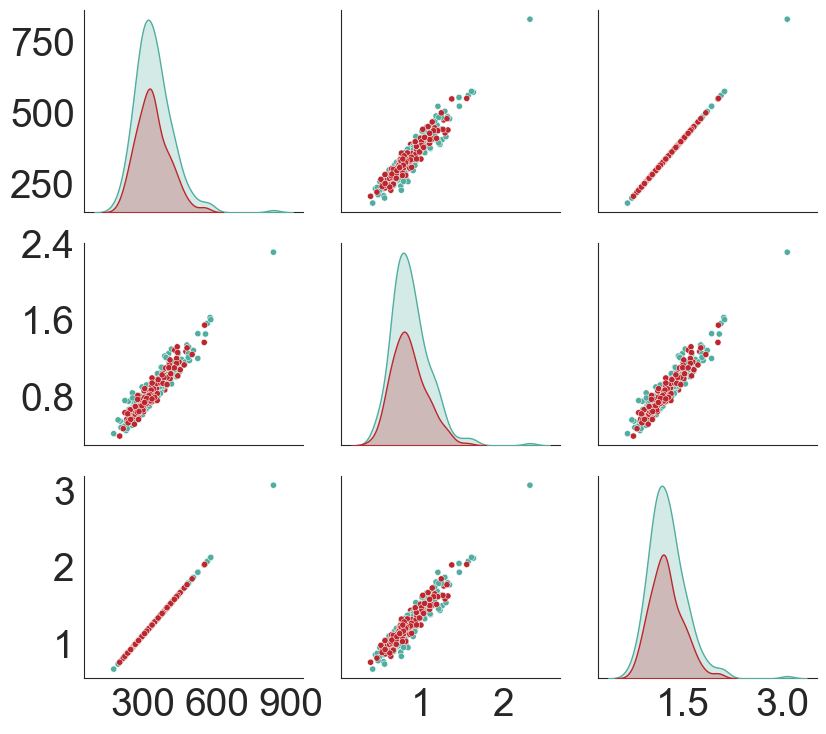

Pairplot for Cultivar: CON, Stage: 3


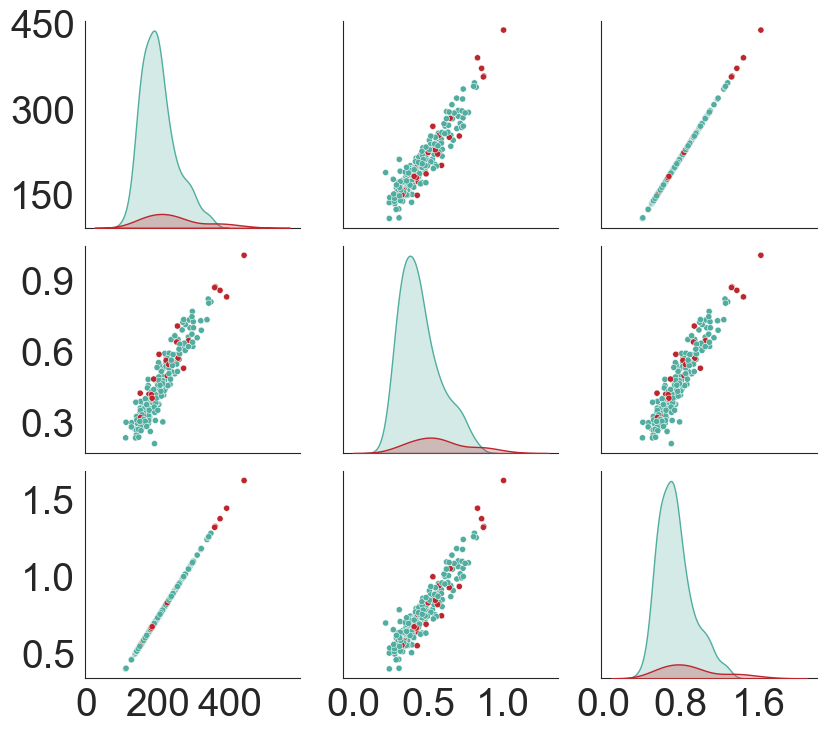

Pairplot for Cultivar: PN, Stage: 3


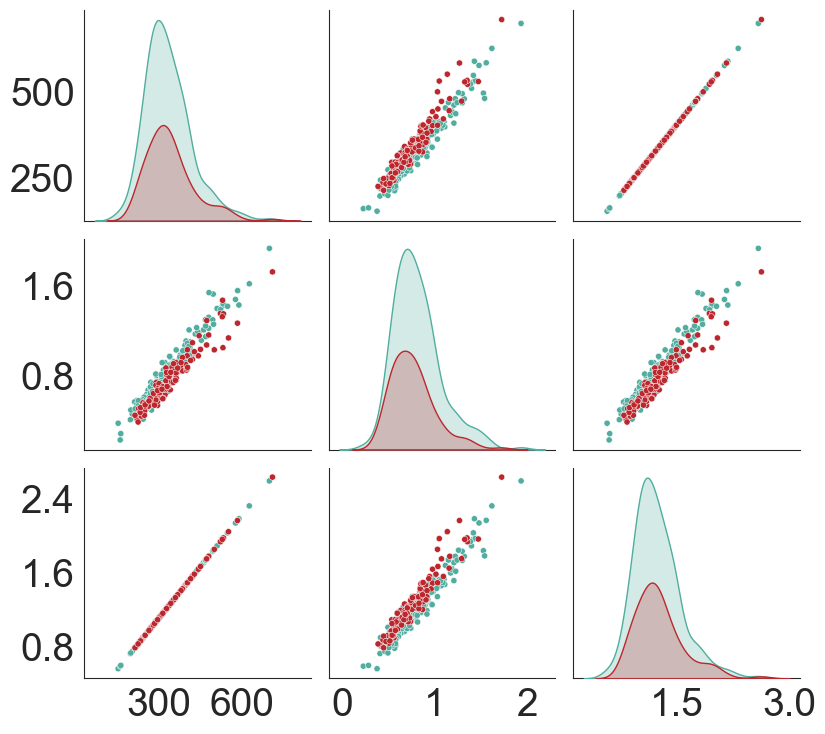

Pairplot for Cultivar: RIES, Stage: 3


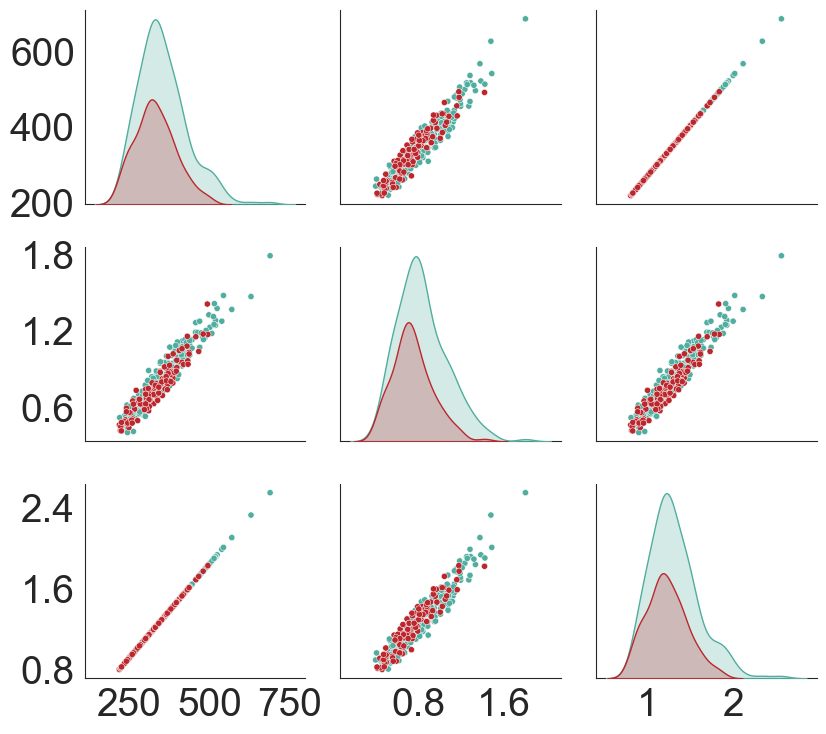

Pairplot for Cultivar: CF, Stage: 4


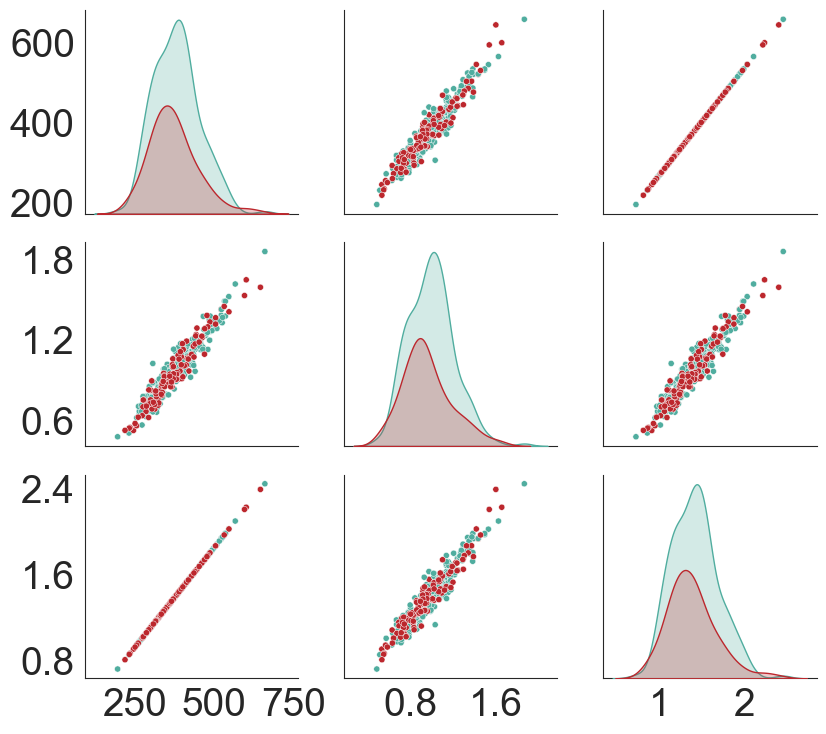

Pairplot for Cultivar: CON, Stage: 4


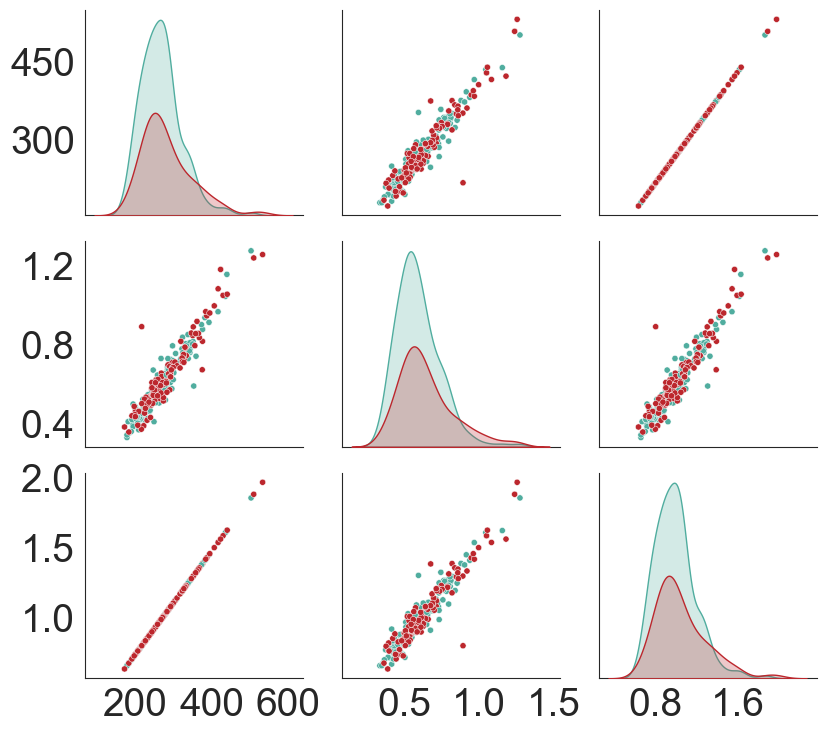

Pairplot for Cultivar: PN, Stage: 4


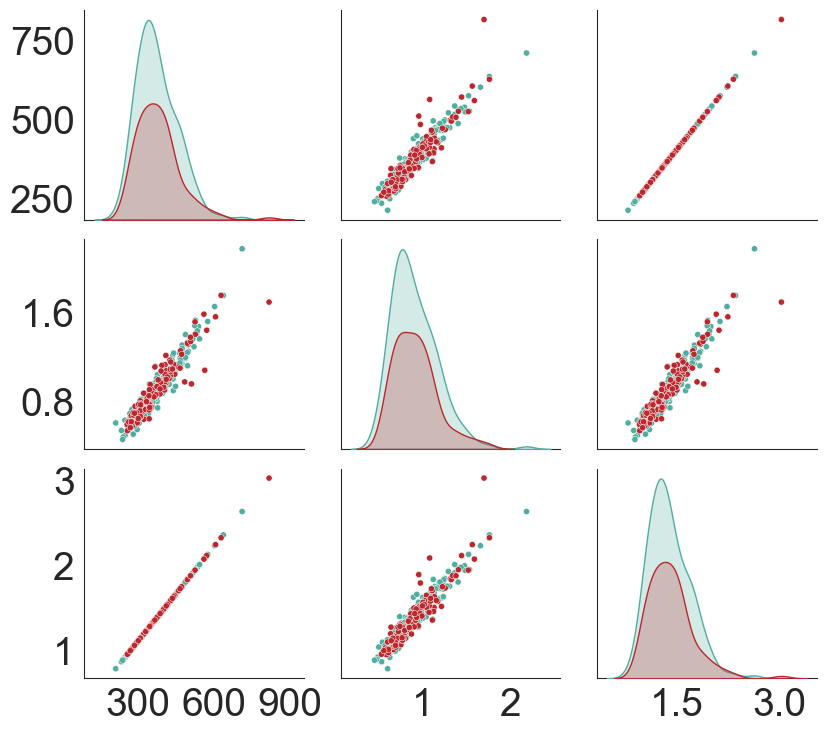

Pairplot for Cultivar: RIES, Stage: 4


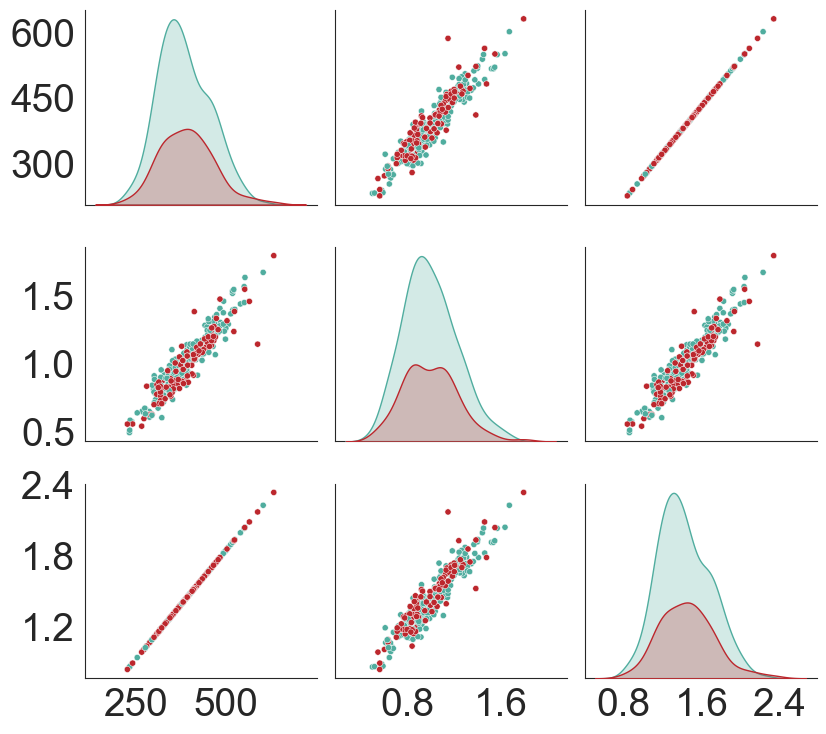

Pairplot for Cultivar: CF, Stage: 5


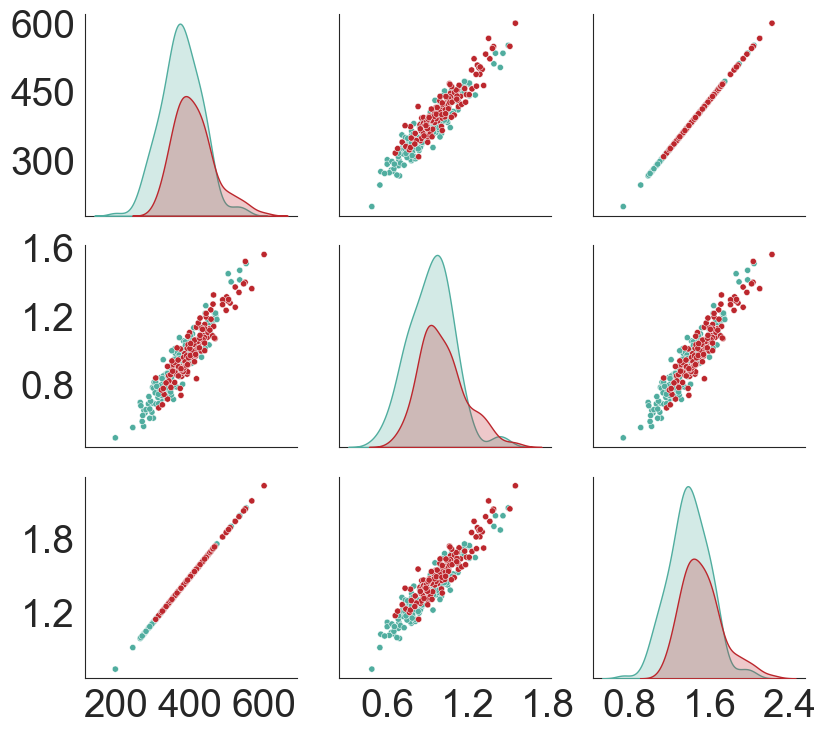

Pairplot for Cultivar: CON, Stage: 5


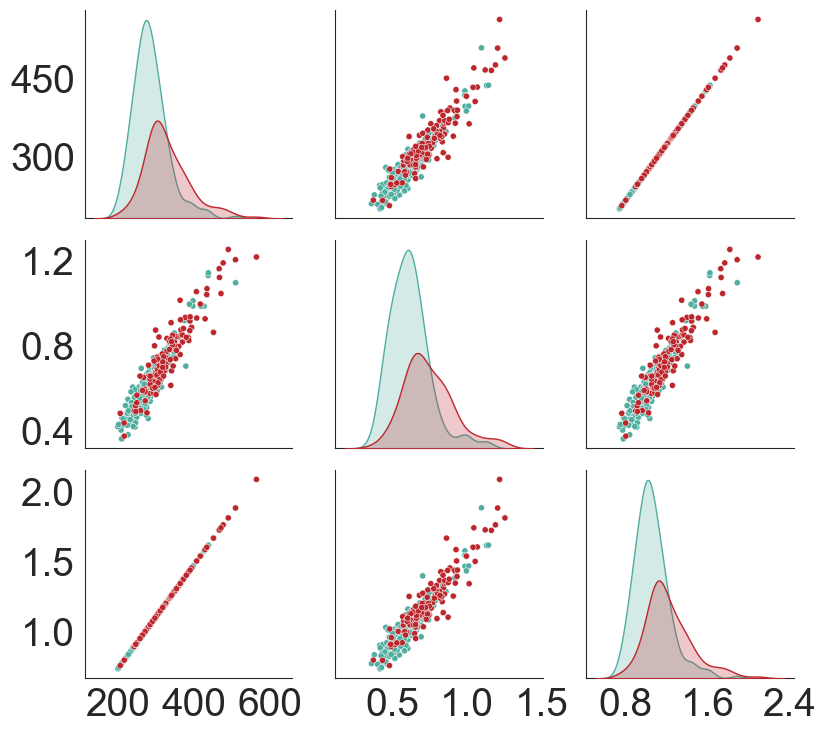

Pairplot for Cultivar: PN, Stage: 5


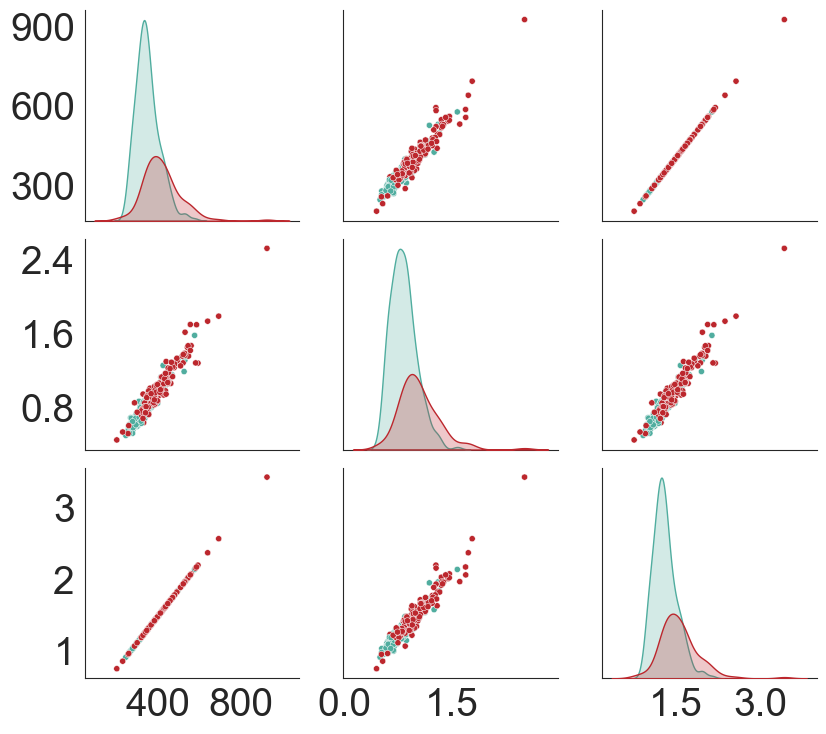

Pairplot for Cultivar: RIES, Stage: 5


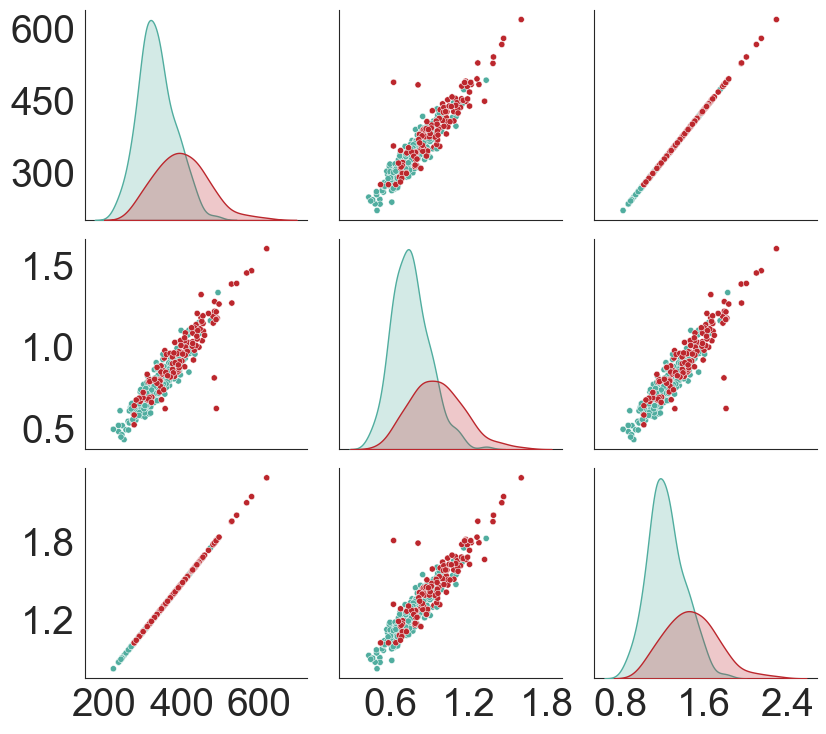

Pairplot for Cultivar: CF, Stage: 6


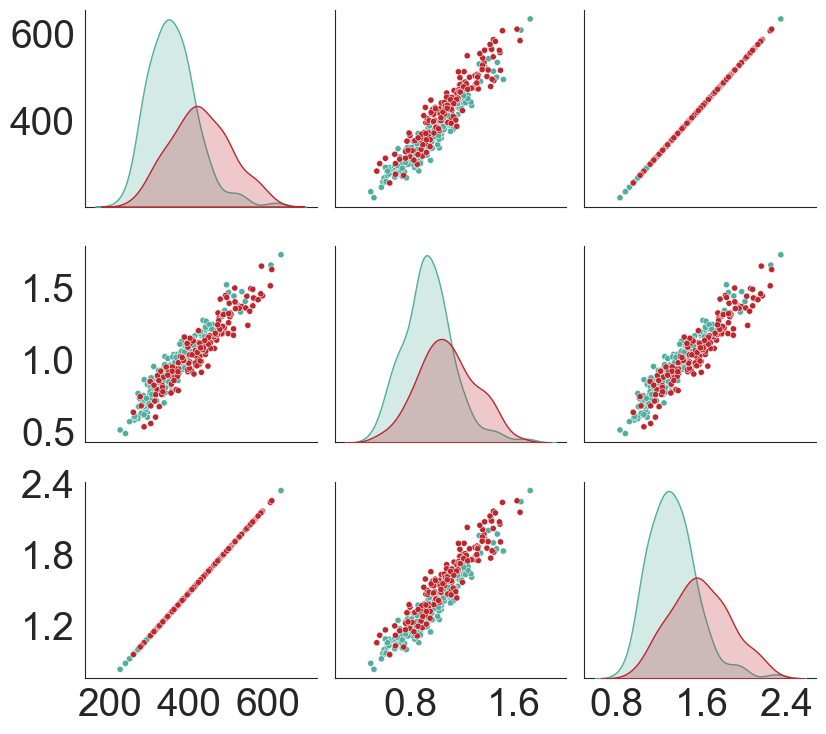

Pairplot for Cultivar: CON, Stage: 6


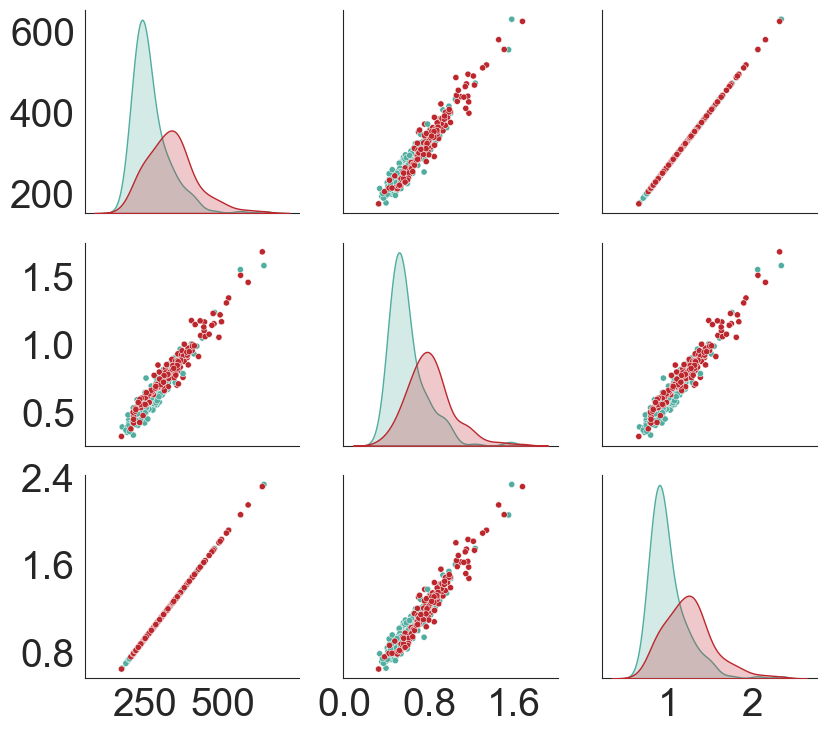

Pairplot for Cultivar: PN, Stage: 6


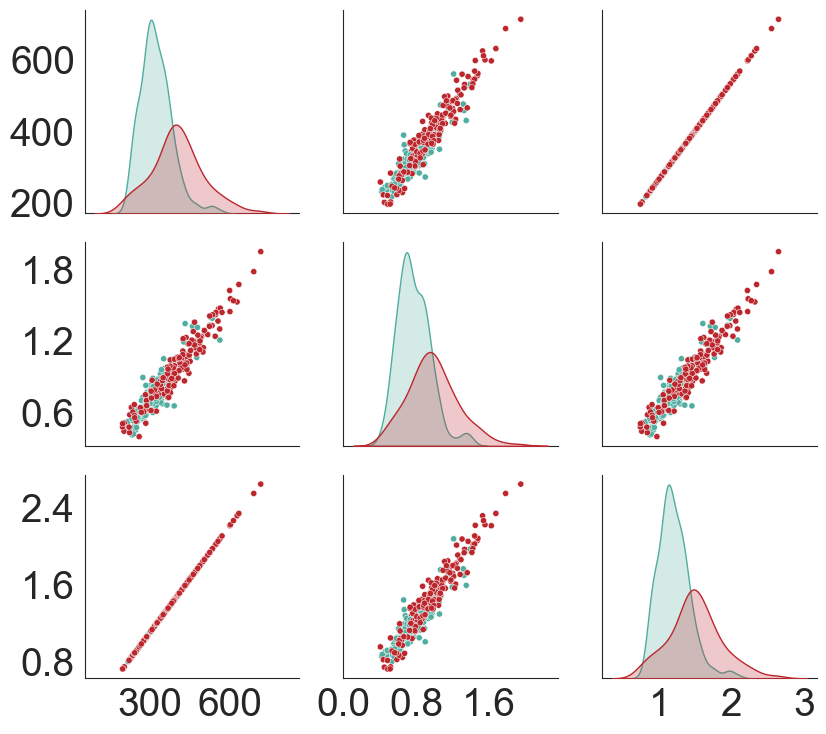

Pairplot for Cultivar: RIES, Stage: 6


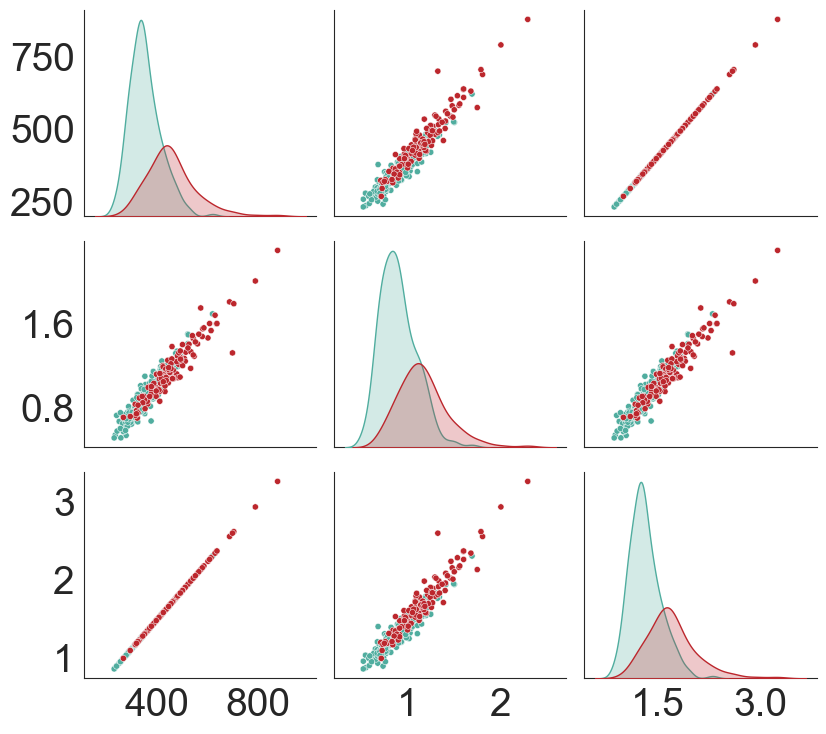

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def process_waveform_all_pairwise(rounds):
    # Load the data
    df = pd.read_csv('./csv/stat_all_data_noabnormal_extend_mean_normalization.csv')

    sns.set_style("white")
    plt.rcParams.update({
        'font.size': 12,  # Set the minimum font size
        'axes.titlesize': 12,
        'axes.labelsize': 12,
        'xtick.labelsize': 11,
        'ytick.labelsize': 11,
        'legend.fontsize': 11,
        'figure.titlesize': 14
    })
    custom_palette = {0: '#bc272d', 1: '#50ad9f'}

    # Prepare pairwise scatter plots for each round
    for i, round in enumerate(rounds):
        df_round = df[df['dev_stage'] == round]
        cultivars = df_round['cultivar'].unique()

        for cultivar in cultivars:
            # Filter data for the specific cultivar
            df_subset = df_round[df_round['cultivar'] == cultivar]
            
            # Create the pairplot
            print(f'Pairplot for Cultivar: {cultivar}, Stage: {round}')

            # Create a seaborn pairplot
            pairplot = sns.pairplot(
                df_subset,
                vars=['peak_temperature', 'falling_waveform_feature', 'rising_waveform_feature'],
                hue='mortality',
                palette=custom_palette,
                plot_kws={'s': 20}
            )

            # Add title and adjust layout
            pairplot._legend.remove()
            for ax in pairplot.axes.flatten():
                if ax is not None:  # Safety check for empty axes
                    ax.set_xlabel(None)
                    ax.set_ylabel(None)
                    ax.xaxis.set_major_locator(plt.MaxNLocator(3))
                    ax.yaxis.set_major_locator(plt.MaxNLocator(3))
                    ax.tick_params(axis='both', which='major', labelsize=28)

            # Save the pairplot as a high-quality SVG
            plt.tight_layout()
            plt.savefig(f'./plots/pairplot/pairplot_{cultivar}_stage{round}.svg', bbox_inches='tight')
            plt.show()

# Example usage
rounds_to_plot = [2, 3, 4, 5, 6]  # Specify the rounds you want to include
process_waveform_all_pairwise(rounds_to_plot)
